# Capstone Project - City Exploration: New Orleans
### Applied Data Science Capstone by IBM/Coursera
### Project By: Christine Bello

## Table of Contents <a name="toc"></a>
- [Introduction: Business Problem](#introduction)
- [Data](#data)
- [Methodology](#methodology)
- [Analysis](#analysis)
- [Results and Discussion](#results)
- [Conclusion](#conclusion)

## 1. Introduction: Business Problem <a name="introduction"></a>
[Back to Table of Contents](#toc)

### 1.1	Background

In 2005 America's Big Easy was ravaged by a devastating act of nature. Hurricane Katrina stole the lives and livelihoods of many American citizens, and while there are no words to describe the devastation or heartache of the victims, the disaster brought communities and the American people together to respond and rebuild.

Since that time New Orleans has seen remarkable growth! While the population remains at 80% of what it was pre-Katrina, according to the Census Bureau in 2012, New Orleans ranked # 1 for population growth at 4.9%. Which is more than six times the national average.

According to the World Population Review:

> "There's no doubt that Hurricane Katrina was a terrible disaster and tragedy, but it gave New Orleans the money and opportunity to rebuild and reinvent itself [...] If current trends hold, New Orleans should have no trouble making its way back to pre-Katrina levels and possibly beyond before the next census in 2020."

### 1.2	Objective

For individuals considering a move to the Big Easy, this presentation aims to provide district recommendations using information about demographics, economy, education, local venues and crime data.

### 1.3	Justification/Interest

The city is known for its rich culture and history, but during this period of regrowth has also embraced new technology, ideas, and businesses to drive population growth.  Due to the renovations and investment into the area, New Orleans is a point of interest for individuals (stakeholders) looking to relocate.

## 2. Data <a name="data"></a>
[Back to Table of Contents](#toc)

- [2.1 Required Data](#2.1data)
- [2.2 Data Sources](#2.2data)
- [2.3 Data Collection and Cleaning](#2.3data)
    - [2.3.1 Prep Work](#2.3.1data)
    - [2.3.2 Create Functions](#2.3.2data)
    - [2.3.3 Collect Data](#2.3.3data)
        - [Neighborhood Data](#2.3.3.1data)
        - [Aesthetics Data](#2.3.3.2data)
        - [Affordability Data](#2.3.3.3data)
        - [Safe Environment Data](#2.3.3.4data)
        - [Goods and Services Data](#2.3.3.5data)
            - [Residential Data](#residentialsets)
            - [Hospitality/Tourism Data](#hospitalitysets)
            - [Businesses Data](#shoppingsets)
            - [FourSquare Data](#foursquaredata)

### 2.1 Required Data. <a name="2.1data"></a>
[Back to Data](#data)

See [Methodology](#methodology) section for more information about why we're collecting the following data sets:

**To provide the stakeholders the necessary information factors of interest would include:**

* **Neighborhood Boundaries**
* **Aesthetics**: New Construction 
* **Affordability**: Home Value
* **Safe environment**: Emergency Services, Crime Density
* **Goods and Services Availability**: Residential, Hospitality, Shopping, FourSquare

### 2.2 Data Sources <a name="2.2data"></a>

[Back to Data](#data)

**The following data sources will be used to extract/generate the required information:**

- **Neighborhood Data**
    - [Neighborhood Statistical Areas of New Orleans](https://portal-nolagis.opendata.arcgis.com/datasets/neighborhood-statistical-areas)
    - [Coordinates for Neighborhoods within New Orleans](https://en.wikipedia.org/wiki/Neighborhoods_in_New_Orleans)


- **Aesthetics**
    - [Market Value Analysis](https://data.nola.gov/dataset/Market-Value-Analysis/3wth-pn47)


- **Affordability** 
    - [Best Neighborhoods in New Orleans](https://www.homesnacks.net/best-neighborhoods-in-new-orleans-la-128171/)


- **Safe Environment**
    - *EMS Services* 
        - [Hospitals](https://data.nola.gov/dataset/Hospitals/nssf-6fhk)
        - [Public Health Clinics](https://data.nola.gov/dataset/Public-Health-Clinics/etsp-wac5)
        - [Drug Stores](https://data.nola.gov/Public-Safety-and-Preparedness/Drug-Stores/6fns-sifv)
        - [Evacuspots](https://data.nola.gov/dataset/Evacuspots/ys6n-yuem)
    - *Crime Data*
        - [2019 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2019/qf6q-pp4b)


- **Goods and Services**
    - *Residential Data*
        - [Schools](https://data.nola.gov/dataset/School-Locations/cntj-3bva)
        - [Libraries](https://data.nola.gov/dataset/Public-Libraries/gvw2-nxwj)
        - [Places of Worship](https://data.nola.gov/dataset/Places-of-Worship/vatk-5mus)
    - *Hospitality/Tourism*
        - [Hotels/Motels/Boarding](https://data.nola.gov/Economy-and-Workforce/Hotels-Motels-B-Bs-and-Boarding-Houses-map-/ca2r-ptws)
        - [Visual Arts and Crafts (Museums/Arts/Galleries)](https://data.nola.gov/Economy-and-Workforce/Live-Entertainment-Permits/fi6r-tech)
        - [Restaurants](https://data.nola.gov/dataset/Restaurants/yc3w-jdut)
        - [Entertainment](https://data.nola.gov/dataset/Entertainment/h35s-tjbh)
    - *Shopping*
        - [Businesses](https://data.nola.gov/Economy-and-Workforce/Occupational-Business-Licenses/hjcd-grvu)
    - *Points of Interest - **FourSquare API***

### 2.3 Data Collection and Cleaning <a name="2.3data"></a>

[Back to Data](#data)

- [2.3.1 Prep Work](#2.3.1data)
- [2.3.2 Create Functions](#2.3.2data)
- [2.3.3 Collect Data](#2.3.3data)

#### 2.3.1 Prep Work (Updating Console, Installing Libraries/Folium and Creating Functions for Data Collection) <a name="2.3.1data"></a>

[Back to 2.3 Data Collection and Cleaning](#2.3data)

In [1]:
!pip install geopy
!pip install geopandas
!pip install bs4
!pip install mapclassify
!pip install descartes
!pip install geoplot

     |████████████████████████████████| 102kB 17.3MB/s ta 0:00:01
     |████████████████████████████████| 921kB 24.5MB/s eta 0:00:01
     |████████████████████████████████| 1.5MB 29.5MB/s eta 0:00:01
     |████████████████████████████████| 11.8MB 28.9MB/s eta 0:00:01
     |████████████████████████████████| 81kB 13.3MB/s eta 0:00:01
     |████████████████████████████████| 102kB 18.3MB/s ta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/a0/b0/b2/4f80b9456b87abedbc0bf2d52235414c3467d8889be38dd472
Successfully built bs4
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/fc/b8/58/56b650743289cbecb476ef1fc50ab0aeaa0b12e56ad912d624
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/d7/de/2e/efa132238792efb6459a96e85916ef8597fcb3d2ae51590dfd
Successfully built mapclassify wrapt
     |████████████████████████████████| 8.9MB 6.6MB/s eta 0:00:01     |███████▋                        | 2.1MB 6.6MB/s eta 0:00:02
  Installing build dependencies ... done
  Getting requ

In [3]:
pip install rtree

     |████████████████████████████████| 512kB 16.4MB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/c4/63/3f/d7e15c43ea44bcee332a90bc4eb5cdb7d21262655cfbc915b4
Successfully built rtree
Note: you may need to restart the kernel to use updated packages.


In [2]:
conda install -c conda-forge libspatialindex=1.9.3

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.7.12

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs: 
    - libspatialindex=1.9.3


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    scikit-learn-0.20.1        |   py36h22eb022_0         5.7 MB
    liblapack-3.8.0            |      11_openblas          10 KB  conda-forge
    scipy-1.3.2                |   py36h921218d_0        18.0 MB  conda-forge
    libopenblas-0.3.6          |       h5a2b251_2         7.7 MB
    liblapacke-3.8.0           |      11_openblas          10 KB  conda-forge
    numpy-1.17.3               |   py36h95a1406_0         5.2 MB  conda-forge
    libspatialindex-1.9.3      |       he1b5a44_1         3.1 MB  co

In [4]:
# Data Collection Tools

import requests # library to handle requests - Data Collection
import json # library to handle JSON files - Data Collection

import pandas as pd # library for data analsysis - Data Collection
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe - Data Collection

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values - Data Collection
from geopy.extra.rate_limiter import RateLimiter 

from bs4 import BeautifulSoup # library to handle web scraping - Data Collection

import geopandas as gpd # library to handle geopandas files and datasets - Data Collection

# Analysis Tools

# import k-means from clustering stage - Analysis
from sklearn.cluster import KMeans
import numpy as np # library to handle data in a vectorized manner - Analysis

# Visualization Tools

# libraries for displaying images - Visualization
from IPython.display import Image 
from IPython.core.display import HTML

import folium  # map rendering library - Visualization

# Matplotlib and associated plotting modules - Visualization
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib import pyplot as plt

import contextily as ctx

#### 2.3.2 Create Functions for Data Collection <a name="2.3.2data"></a>

[Back to 2.3 Data Collection and Cleaning](#2.3data)

Now that we have the datasets we intend to use for our project. We will need to import that data into a useable DF. Since we have a lot of datasets to add, we will use the following functions to create a large dataset for visualization later on. 

- First we will create a DF from the GeoJSON file, we will extrapolate the Longitude and Latitude for our points of interest to use for visualization later on. 
- Secondly we will create a new dataframe to merge and add select information (Geometry, Name of POI, Address for POI), to a single dataframe with specific counts of offerings within each neighborhood.

In [5]:
#Data Collection

#Create a DataFrame from a GeoJSON File
def df_create(file):
    df = gpd.read_file(file)
    df['lon'] = df.geometry.x
    df['lat'] = df.geometry.y
    df = df[pd.notnull(df['lon'])]
    df = df[pd.notnull(df['lat'])]
    return df

# Clean DataFrame to use later with (Geometry, Name of POI, Address for POI)
# We'll use this to build our Database.
def table_prep(df, Type, SubType):
    df = df.loc[:,['geometry','name','address']]
    df['Type'] = Type
    df['SubType'] = SubType
    return df

#### 2.3.3 Collect Data <a name="2.3.3data"></a>

[Back to 2.3 Data Collection and Cleaning](#2.3data)

- [Neighborhood Data](#2.3.3.1data)
- [Aesthetics Data](#2.3.3.2data)
- [Affordability Data](#2.3.3.3data)
- [Safe Environment Data](#2.3.3.4data)
- [Goods and Services Data](#2.3.3.5data)

##### 2.3.3.1 Neighborhood Data <a name="2.3.3.1data"></a>

[Back to 2.3.3 Collect Data](#2.3.3data)

* Neighborhood Statistical Areas of New Orleans
* Coordinates for Neighborhoods within New Orleans

In [3]:
#Start with Neighborhood Data - Create Dataframe for our Boundaries
# Because our Neighborhoods have a multipolygon geometry we won't use the function we created. Instead we will simply read the data into a gpd.df.

NolaBoundariesJSON = 'https://opendata.arcgis.com/datasets/e7daa4c977d14e1b9e2fa4d7aff81e59_0.geojson' #create variable for JSON
nola_nb_df = gpd.read_file(NolaBoundariesJSON)
nola_nb_df.head()

,OBJECTID,GNOCDC_LAB,Shape_Length,Shape_Area,geometry
0,865,U.S. NAVAL BASE,24814.676237,2.965424e+07,"POLYGON ((-90.02668 29.95321, -90.03275 29.955..."
1,866,ALGIERS POINT,15434.791720,1.375080e+07,"POLYGON ((-90.04538 29.95811, -90.04744 29.958..."
2,867,WHITNEY,25858.258690,1.842169e+07,"POLYGON ((-90.03808 29.95671, -90.04158 29.957..."
3,868,AUDUBON,39015.654380,6.325782e+07,"POLYGON ((-90.10964 29.94136, -90.11052 29.941..."
4,869,OLD AURORA,39878.264239,8.663475e+07,"POLYGON ((-90.01204 29.94595, -90.01211 29.945..."


We will be using this DF as our main DF as it contains the NOLA boundaries for each Neighborhood. We don't need the OBJECTID, Shape_Length or Shape_Area columns, and our column with the neighborhoods can be renamed. We should also rename 'geometry' as many of the dfs we will examine will have a 'geometry' column. After executing the following code we should be left with a DF that has the neighborhood name as well as it's geometry(Boundary_Geometry).

In [4]:
nola_nb_df = nola_nb_df.rename(columns={'GNOCDC_LAB':'Neighborhood'})

nola_nb_df = nola_nb_df.drop(columns=['OBJECTID','Shape_Length','Shape_Area'])
nola_nb_df.head()

,Neighborhood,geometry
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955..."
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958..."
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957..."
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941..."
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945..."


*While the GeoJSON file we have illustrates the boundaries around each of the neighborhoods, the FourSquare calculations we will do later will require the longitude and latitude of each of the neighborhoods as well. I used the following code to scrape the data from Wikipedia.*

We could also get this information by using the centroid method. I'll show both methods.

Scraping Method:

In [5]:
data = requests.get('https://en.wikipedia.org/wiki/Neighborhoods_in_New_Orleans').text
soup = BeautifulSoup(data,'html5lib')

table = soup.find('table')
fields = table.find_all('td')

neighborhood = []
longitude = []
latitude = []

#loop to add data in table
for i in range(0, len(fields), 3):
    neighborhood.append(fields[i].text.strip())
    longitude.append(float(fields[i+1].text.strip()))
    latitude.append(float(fields[i+2].text.strip()))
    
# Put Scraped data into dataframe

scrape_nola_nbh = [('Neighborhood', neighborhood),
               ('Longitude', longitude),
               ('Latitude', latitude)]
scrape_nola_df = pd.DataFrame.from_dict(dict(scrape_nola_nbh))
scrape_nola_df.head()

,Neighborhood,Longitude,Latitude
0,U.S. NAVAL BASE,-90.026093,29.946085
1,ALGIERS POINT,-90.051606,29.952462
2,WHITNEY,-90.042357,29.947200
3,AUDUBON,-90.121450,29.932994
4,OLD AURORA,-90.000000,29.924440


Centroid Method:

In [6]:
#Create "Centroid" column. This is creating a centralized point within the polygon of our neighborhood boundaries
nola_nb_df['Nola_Centroid'] = nola_nb_df.centroid
nola_nb_df.head()

,Neighborhood,geometry,Nola_Centroid
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725)
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311)
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622)
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145)
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595)


In [7]:
#Now's a good time to rename our boundaries geometry so we don't get confused with other geometry points (like the centeroid geometry we just created)
nola_nb_df = nola_nb_df.rename(columns={'geometry':'Boundary_Geometry'})

#In order to extrapolate Longitude and Latitude, our Centroid geometry needs to be the main geometry used in the calculations.
#We set the geometry using the following code
nola_nb_df = nola_nb_df.set_geometry('Nola_Centroid')


In [8]:
# Extrapolate Longitude and Latitude and add it to their own columns
nola_nb_df['Longitude'] = nola_nb_df.geometry.x
nola_nb_df['Latitude'] = nola_nb_df.geometry.y
nola_nb_df.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954


In [9]:
# Reset Geometry to our Boundary Set.
nola_nb_df = nola_nb_df.set_geometry('Boundary_Geometry')

Since our nola_nb_df has the boundary geometry we'll continue to use that one rather than the dataset we got from Wikipedia, but as you can see the coordinates are fairly similar.

##### 2.3.3.2 Aesthetics Data <a name="2.3.3.2data"></a>

[Back to 2.3.3 Collect Data](#2.3.3data)

* Market Value Analysis

Much of the data analysis we would do on this dataset has been done, but we can replicate it for later. For now we'll just import the data into a df for later use. Again, because the geometry is a multipolygon as opposed to a point, we may need to use the centeroid method again.

In [10]:
mva = gpd.read_file('https://data.nola.gov/resource/unzn-zaez.geojson')
mva.head()

,percentowneroccupied,percentsubsidizedrental,percentinspectionviolations,objectid,mspxvlnd16,percentvacantlandsales,cluster,percentvacantlots,percentforeclosure,percentshorttermrentals,percentresidentialaddressesvacant,percentnewconstruction,coefvar161,geoid,geometry
0,40.295358649800001,0,2.2522522522499999,152,512000,0,A,0,0.52356020942400006,1.82648401826,3.444,6.3063063063099998,0.50903209428999996,220710099001,"MULTIPOLYGON (((-90.09554 29.92692, -90.09470 ..."
1,58.964143426299998,8.7378640776700003,3.9215686274499997,438,220000,0,C,3.9215686274499997,2.0270270270299999,3.69230769231,3.27,11.274509803899999,0.60300268796300005,220710130001,"MULTIPOLYGON (((-90.12869 29.95572, -90.12795 ..."
2,86.690647482000003,0,1.08108108108,59,416500,2.7777777777800003,A,6.2162162162200003,0.41493775933600002,0,0,6.2162162162200003,0.45358798445199999,220710056022,"MULTIPOLYGON (((-90.10432 30.00833, -90.10412 ..."
3,75.367647058800003,79.104477611900009,8.4668192219699989,30,135000,23.333333333300001,F,11.441647597300001,4.39024390244,0,0.25600000000000001,5.94965675057,0.53776442193200003,220710017022,"MULTIPOLYGON (((-90.04280 30.01392, -90.04264 ..."
4,45.154639175299998,6.7669172932299997,2.9801324503299997,252,268673,3.125,B,2.3178807946999997,0.45662100456600002,3.9175257731899995,5.492,6.6225165562900008,0.22746610358800001,220710001001,"MULTIPOLYGON (((-90.05147 29.95572, -90.05052 ..."


##### 2.3.3.3 Affordability Data <a name="2.3.3.3data"></a>

[Back to 2.3.3 Collect Data](#2.3.3data)

* Detailed List of the Best Neighborhoods to Live in New Orleans for 2019

We'll be scraping data off of homesnacks.net that has a clever table with rank, Neighborhood, Population, Home Value and Median Income. For now we'll be using the Median Income and Home Value, but the population will also speak to the Aesthetics of the neighborhoods and how densely populated the neighborhood is.

In [11]:
data = requests.get('https://www.homesnacks.net/best-neighborhoods-in-new-orleans-la-128171/').text
soup = BeautifulSoup(data,'html5lib')

table = soup.find('table')
fields = table.find_all('td')

rank = []
neighborhood = []
population = []
home_value = []
median_income = []

#loop to add data in table
for i in range(0, len(fields), 5):
    rank.append(fields[i].text.strip())
    neighborhood.append(fields[i+1].text.strip())
    population.append(fields[i+2].text.strip())
    home_value.append(fields[i+3].text.strip())
    median_income.append(fields[i+4].text.strip())
    
# Put Scraped data into dataframe

affordability_dict = [('Rank', rank),
                   ('Neighborhood', neighborhood),
                   ('Population', population),
                   ('Home Value', home_value),
                   ('Median Income', median_income)]
affordability_df = pd.DataFrame.from_dict(dict(affordability_dict))
affordability_df.head()

,Rank,Neighborhood,Population,Home Value,Median Income
0,1,Audubon,"16,424","$625,889","$98,953"
1,2,Uptown,"6,504","$444,700","$72,123"
2,3,Garden District,"2,072","$628,700","$136,916"
3,4,Marlyville-Fontainebleau,"5,930","$341,450","$69,737"
4,5,Lake Shore-Lake Vista,"2,957","$440,800","$115,905"


##### 2.3.3.4 Safe Environment Data <a name="2.3.3.4data"></a>

[Back to 2.3.3 Collect Data](#2.3.3data)

- EMS Services
We have datasets on the following: Hospitals, Public Health Clinics, Drug Stores, Evacuspots. Let's create a merged DF with this information to use for visualization and analysis later.

- Crime Data
Let's create a df for 2019 Calls for Service to be used in Analysis and Visualization later.

In [12]:
#Create DF for Visualization
hospital_df_vis = df_create('https://data.nola.gov/resource/7igs-isbv.geojson')
#Preview for Cleaning
hospital_df_vis.head()

,name,featurecode,fulladdr,subtypefield,objectid,type,geometry,lon,lat
0,Children's Hospital,Health or Medical Facility,200 HENRY CLAY AVE,800,4705,Hospital,POINT (-90.12787 29.91725),-90.127868,29.917254
1,Touro Infirmary,Health or Medical Facility,1401 FOUCHER ST,800,4700,Hospital,POINT (-90.09229 29.92565),-90.092288,29.925653
2,Tulane Medical Center,Health or Medical Facility,1415 TULANE AVE,800,4702,Hospital,POINT (-90.07602 29.95547),-90.076023,29.955466
3,Kindred Hospital of New Orleans,Health or Medical Facility,3601 COLISEUM ST,800,4706,Hospital,POINT (-90.09321 29.92483),-90.093213,29.924830
4,Community Care Hospital,Health or Medical Facility,1421 GENERAL TAYLOR,800,4701,Hospital,POINT (-90.09597 29.92606),-90.095967,29.926057


In [13]:
#Rename Columns for Analysis
hospital_df_vis = hospital_df_vis.rename(columns={'fulladdr':'address'})
hospital_df_vis.head()

,name,featurecode,address,subtypefield,objectid,type,geometry,lon,lat
0,Children's Hospital,Health or Medical Facility,200 HENRY CLAY AVE,800,4705,Hospital,POINT (-90.12787 29.91725),-90.127868,29.917254
1,Touro Infirmary,Health or Medical Facility,1401 FOUCHER ST,800,4700,Hospital,POINT (-90.09229 29.92565),-90.092288,29.925653
2,Tulane Medical Center,Health or Medical Facility,1415 TULANE AVE,800,4702,Hospital,POINT (-90.07602 29.95547),-90.076023,29.955466
3,Kindred Hospital of New Orleans,Health or Medical Facility,3601 COLISEUM ST,800,4706,Hospital,POINT (-90.09321 29.92483),-90.093213,29.924830
4,Community Care Hospital,Health or Medical Facility,1421 GENERAL TAYLOR,800,4701,Hospital,POINT (-90.09597 29.92606),-90.095967,29.926057


In [14]:
#Create DF to be Merged in Master File for Analysis
hospital_analysis = table_prep (hospital_df_vis, 'Emergency Services', 'Hospital')
hospital_analysis.head()

,geometry,name,address,Type,SubType
0,POINT (-90.12787 29.91725),Children's Hospital,200 HENRY CLAY AVE,Emergency Services,Hospital
1,POINT (-90.09229 29.92565),Touro Infirmary,1401 FOUCHER ST,Emergency Services,Hospital
2,POINT (-90.07602 29.95547),Tulane Medical Center,1415 TULANE AVE,Emergency Services,Hospital
3,POINT (-90.09321 29.92483),Kindred Hospital of New Orleans,3601 COLISEUM ST,Emergency Services,Hospital
4,POINT (-90.09597 29.92606),Community Care Hospital,1421 GENERAL TAYLOR,Emergency Services,Hospital


In [15]:
#Create DF for Visualization
healthClinic_df_vis = df_create('https://data.nola.gov/resource/4f4g-chfh.geojson')
#Rename Columns
healthClinic_df_vis = healthClinic_df_vis.rename(columns={'publichealthcentersandhospitals':'name'})
#TablePrep for Analysis
healthClinic_analysis = table_prep (healthClinic_df_vis, 'Emergency Services', 'Health Clinic')
#Show DFs
print(healthClinic_df_vis.head())
print(healthClinic_analysis.head())

  objectid        service                                  name  \
0       23   PRIMARY CARE          HEALTH CARE FOR THE HOMELESS   
1        4      CHILDRENS                    CHILDRENS HOSPITAL   
2       20   PRIMARY CARE          EXCELTH FAMILY HEALTH CENTER   
3       29  HIV/AIDS CARE  LSU PUBLIC HOSPITAL HIV/AIDS PROGRAM   
4       13  MENTAL HEALTH                 TULANE DROP-IN CENTER   

                  address                  type                    geometry  \
0  2222 SIMON BOLIVAR AVE  PUBLIC HEALTH CLINIC  POINT (-90.08550 29.93834)   
1      200 HENRY CLAY AVE              HOSPITAL  POINT (-90.12787 29.91725)   
2           2050 CATON ST  PUBLIC HEALTH CLINIC  POINT (-90.06231 29.99868)   
3         2235 POYDRAS ST  PUBLIC HEALTH CLINIC  POINT (-90.08956 29.95730)   
4    1461 N CLAIBORNE AVE  PUBLIC HEALTH CLINIC  POINT (-90.06799 29.97075)   

         lon        lat  
0 -90.085496  29.938343  
1 -90.127868  29.917254  
2 -90.062309  29.998676  
3 -90.089559  29.9

In [16]:
#Create DF for Visualization
drugstore_df_vis = df_create('https://data.nola.gov/resource/g2jk-maai.geojson')
#Rename Columns
drugstore_df_vis = drugstore_df_vis.rename(columns={'ownername':'name'})
#TablePrep for Analysis
drugstore_analysis = table_prep (drugstore_df_vis, 'Emergency Services', 'Drugstore')
#Show DFs
print(drugstore_df_vis.head())
print(drugstore_analysis.head())

          city    zip state                businessname  \
0  NEW ORLEANS  70127    LA             WALGREEN #16312   
1  NEW ORLEANS  70124    LA  CHARBONNET FAMILY PHARMACY   
2  NEW ORLEANS  70112    LA        CVS/PHARMACY # 10108   
3  NEW ORLEANS  70117    LA         CVS/PHARMACY #10538   
4  NEW ORLEANS  70116    LA              ROYAL PHARMACY   

                      businesstype      locationy objectid      locationx  \
0  1120 - PHARMACIES & DRUG STORES  558099.921883    74820  3704989.80811   
1  1120 - PHARMACIES & DRUG STORES  554951.808856    74779  3666277.18855   
2  1120 - PHARMACIES & DRUG STORES  560921.573022    74790  3710244.30904   
3  1120 - PHARMACIES & DRUG STORES  535907.274247    74792  3696514.68714   
4  1120 - PHARMACIES & DRUG STORES  533660.228549    74815  3683441.34671   

                address                           name   phonenumber suite  \
0     5702 CROWDER BLVD  WALGREEN  LOUISIANA CO., INC.          None  None   
1        7211 REGENT ST   

In [17]:
#Create DF for Visualization
evacuspots_df_vis = df_create('https://data.nola.gov/resource/3baq-w83e.geojson')
#Rename Columns
evacuspots_df_vis = evacuspots_df_vis.rename(columns={'facname':'name'})
#TablePrep for Analysis
evacuspots_analysis = table_prep (evacuspots_df_vis, 'Emergency Services', 'Evacuspots')
#Show DFs
print(evacuspots_df_vis.head())
print(evacuspots_analysis.head())

  objectid                               name  \
0       26  New Orleans East Regional Library   
1       22                 McMain High School   
2       20          Warren Easton High School   
3       18         Stallings Community Center   
4       30                       UPT / Amtrak   

                              accessres                address  \
0  General  Population Pickup Locations         5641 Read Blvd   
1  General  Population Pickup Locations  5712 S. Claiborne Ave   
2  General  Population Pickup Locations          3019 Canal St   
3  General  Population Pickup Locations        4300 St. Claude   
4                     Staging Locations       1001 Loyola Ave.   

                     geometry        lon        lat  
0  POINT (-89.97298 30.03281) -89.972979  30.032814  
1  POINT (-90.11186 29.94221) -90.111856  29.942210  
2  POINT (-90.09060 29.96828) -90.090604  29.968281  
3  POINT (-90.03236 29.96456) -90.032360  29.964562  
4  POINT (-90.07826 29.94665) -90.0782

We now have the following dataframes to be used later:

- hospital_df_vis
- hospital_analysis
- healthClinic_df_vis
- healthClinic_analysis
- drugstore_df_vis
- drugstore_analysis
- evacuspots_df_vis
- evacuspots_analysis

Let's do a final set for Crime Data

In [69]:
crime_df_vis = df_create('https://data.nola.gov/resource/qf6q-pp4b.geojson')
crime_df_vis.shape

(1000, 35)

For our crime data we're only interested in the location of the incident and what kind of incident it was. Let's keep the following columns: typetext and geometry. If we were conducting a different kind of analysis (crime stats) there's a lot of good info here, but we just want to know what kinds of crimes are happening in our neighborhoods and how frequently in the past year.

In [70]:
crime_df_analysis = crime_df_vis.loc[:,['geometry','typetext']]
crime_df_analysis.head()

,geometry,typetext
0,POINT (-90.07993 29.96456),RETURN FOR ADDITIONAL INFO
1,POINT (-90.08135 29.96073),"BURGLAR ALARM, LOCAL"
2,POINT (-90.11251 30.02003),AREA CHECK
3,POINT (-90.08534 29.96505),COMPLAINT OTHER
4,POINT (-90.07466 29.92354),SIMPLE BURGLARY VEHICLE


##### 2.3.3.5 Goods and Services <a name="2.3.3.5data"></a>

[Back to 2.3.3 Collect Data](#2.3.3data)

Similar to our Emergency Services data, we'll be creating dataframes to use later on for visualization and analysis in the following areas:

- [Residential Data](#residentialsets)
    - Schools
    - Libraries
    - Places of Worship
- [Hospitality/Tourism:](#hospitalitysets)
    - Hotels/Boarding
    - Visual Arts and Crafts
    - Restaurants
    - Entertainment
- [Shopping:](#shoppingsets)
    - Businesses
    
Finally we will be conducting a similar cluster analysis for New Orleans as we did with New York and Toronto using FourSquare's API

- [FourSquare](#foursquaredata)
    - Points of Interest

Just so we remember what the full process looks like, we'll print out our dfs for our schools set below. After that we will trust that our functions are working correctly. Later we will merge these datasets to create visualizations and conduct analysis.

**Residential Sets** <a name="residentialsets"></a>

[Back to 2.3.3.5 Goods and Services](#2.3.3.5data)

In [20]:
#Create DF for Visualization
schools_df_vis = df_create('https://data.nola.gov/resource/7ped-k8c7.geojson')
#TablePrep for Analysis
schools_analysis = table_prep (schools_df_vis, 'Residential', 'Schools')
#Show DFs
print(schools_df_vis.head())
print(schools_analysis.head())

                         name enrollment objectid open_close  \
0  Brother Martin High School       None      108       OPEN   
1             St. Rita School       None      148       OPEN   
2     G.W. Carver High School        820       13       OPEN   
3        The Chartwell Center       None      150       OPEN   
4       Corpus Christi School       None      114       OPEN   

                   address                   cmo publicvsprivate  \
0  4401 Elysian Fields Ave                  None         PRIVATE   
1      65 Fontainebleau Dr                  None         PRIVATE   
2        3059 Higgins Blvd  Collegiate Academies          PUBLIC   
3             4239 Camp St                  None         PRIVATE   
4     2022 St. Bernard Ave                  None         PRIVATE   

                     geometry        lon        lat  
0  POINT (-90.05848 30.00400) -90.058480  30.003997  
1  POINT (-90.11471 29.95490) -90.114707  29.954896  
2  POINT (-90.03743 29.99390) -90.037434  29

In [21]:
#Library DF Set
library_df_vis = df_create('https://data.nola.gov/resource/qg5a-tm3t.geojson')
library_df_vis = library_df_vis.rename(columns={'facilityname':'name'})
library_analysis = table_prep(library_df_vis, 'Residential', 'Library')

In [22]:
#Place of Worship DF Set
pow_df_vis = df_create('https://data.nola.gov/resource/6mnn-pzq6.geojson')
pow_df_analysis = table_prep(pow_df_vis, 'Residential', 'Place of Worship')

**Hospitality/Tourism Sets**<a name="hospitalitysets"></a>

[Back to 2.3.3.5 Goods and Services](#2.3.3.5data)

In [23]:
#Hotels DF Set
hotels_df_vis = df_create('https://data.nola.gov/resource/rbhq-zbz9.geojson')
hotels_analysis = table_prep(hotels_df_vis, 'Hospitality', 'Boarding')

In [24]:
#CulturalVenues DF Set
cultural_vis = df_create('https://data.nola.gov/resource/mnzv-nqsd.geojson')
cultural_vis = cultural_vis.rename(columns={'geoaddress':'address'})
cultural_analysis = table_prep(cultural_vis, 'Hospitality', 'Cultural Venue')

In [25]:
#Data Collection

#Create a DataFrame from a GeoJSON File
def df_create(file):
    df = gpd.read_file(file)
    df['lon'] = df.geometry.x
    df['lat'] = df.geometry.y
    df = df[pd.notnull(df['lon'])]
    df = df[pd.notnull(df['lat'])]
    return df

# Clean DataFrame to use later with (Geometry, Name of POI, Address for POI)
# We'll use this to build our Database.
def table_prep(df, Type, SubType):
    df = df.loc[:,['geometry','name','address']]
    df['Type'] = Type
    df['SubType'] = SubType
    return df

In [26]:
#VisualArts DF Set
va_df_vis = df_create('https://data.nola.gov/resource/mnzv-nqsd.geojson')
#Rename Columns
va_df_vis = va_df_vis.rename(columns={'geoaddress':'address','type':'SubType'}) # We are keeping the original "Types" as "SubTypes" thus we need to rename to column header to SubType.

#Since we want to hold onto the SubType column, we'll do our table prep manually
va_df_analysis = va_df_vis.loc[:,['geometry','name','address','SubType']]
#Add Type Column
va_df_analysis['Type'] = 'Hospitality'
#Rearrange Columns
va_df_analysis = va_df_analysis.loc[:,['geometry','name','address','Type','SubType']]
#Check Analytical DF
va_df_analysis.head()

,geometry,name,address,Type,SubType
0,POINT (-90.03955 29.96204),NEW ORLEANS SCHOOL OF ART AND CRAFT,3620 ROYAL ST,Hospitality,School of the Arts
1,POINT (-90.06645 29.95522),ADRIAN FULTON'S FINE ART GALLERIES,618 CONTI ST,Hospitality,Gallery/Exhibit Space
2,POINT (-90.06097 29.95862),ARTICHOKE GALLERY,912 DECATUR ST,Hospitality,Gallery/Exhibit Space
3,POINT (-90.09421 29.92125),"COLE PRATT CONTEMPORARY, LLC",3800 MAGAZINE ST,Hospitality,Gallery/Exhibit Space
4,POINT (-90.08368 29.92540),ANTON HAARDT GALLERY,2858 MAGAZINE ST,Hospitality,Gallery/Exhibit Space


In [27]:
#Restaurants DF Sets
restaurant_df_vis = df_create('https://data.nola.gov/resource/d9bt-jp26.geojson')
restaurant_df_vis = restaurant_df_vis.rename(columns={'businessname':'name'})
restaurant_analysis = table_prep(restaurant_df_vis, 'Hospitality', 'Restaurant')

In [28]:
#Entertainment DF Sets
entertainment_df_vis = df_create('https://data.nola.gov/resource/g4i9-kjdg.geojson')
entertainment_df_vis = entertainment_df_vis.rename(columns={'geoaddress':'address'})
entertainment_analysis = table_prep(entertainment_df_vis, 'Hospitality', 'Entertainment')
entertainment_analysis.head()

,geometry,name,address,Type,SubType
0,POINT (-90.05593 29.96320),"ARTIST INTERNATIONAL CONNECTION, INC.",519 ELYSIAN FIELDS AVE,Hospitality,Entertainment
1,POINT (-90.05200 29.96863),THE SHADOWBOX,2400 ST CLAUDE AVE,Hospitality,Entertainment
3,POINT (-90.05944 29.96408),R BAR & INN,1431 ROYAL ST,Hospitality,Entertainment
4,POINT (-90.09080 29.93022),DANCE QUARTER,1719 TOLEDANO ST,Hospitality,Entertainment
5,POINT (-90.06539 29.95832),PRESERVATION HALL,726 ST PETER ST,Hospitality,Entertainment


**Shopping Sets**<a name="shoppingsets"></a>

[Back to 2.3.3.5 Goods and Services](#2.3.3.5data)

In [29]:
#Businesses DF Sets
business_df_vis = df_create('https://data.nola.gov/resource/hjcd-grvu.geojson')
business_df_vis = business_df_vis.rename(columns={'businessname':'name', 'businesstype':'SubType'})
business_analysis = business_df_vis.loc[:,['geometry','name','address','SubType']]
business_analysis['Type'] = 'Business'
business_analysis = business_analysis.loc[:,['geometry','name','address','Type','SubType']]

**FourSquare**<a name="foursquaredata"></a>

[Back to 2.3.3.5 Goods and Services](#2.3.3.5data)

We'll be performing the same kind of analysis on our data as we did in the previous labs, but for our New Orleans neighborhood. But first let's test our data collection using a single neighborhood. We'll use the French Quarter as that's one of the more popular neighborhoods.

In [30]:
CLIENT_ID = 'QGM0HJMQEZZVWSSUS2OTAAQ1GZYW1Y3VICIVHEYUNBHVAHPF' # your Foursquare ID
CLIENT_SECRET = 'VYJ5BAJB0XM400UNZBAIXUHYDA4BKT0CI5O3UMKHVPV0U2S3' # your Foursquare Secret
VERSION = '20191105'

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: QGM0HJMQEZZVWSSUS2OTAAQ1GZYW1Y3VICIVHEYUNBHVAHPF
CLIENT_SECRET:VYJ5BAJB0XM400UNZBAIXUHYDA4BKT0CI5O3UMKHVPV0U2S3


In [31]:
nola_df_fs = nola_nb_df
nola_df_fs.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954


In [32]:
nola_df_fs.loc[68, 'Neighborhood']

'FRENCH QUARTER'

In [33]:
neighborhood_latitude = nola_df_fs.loc[68, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = nola_df_fs.loc[68, 'Longitude'] # neighborhood longitude value

neighborhood_name = nola_df_fs.loc[68, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of FRENCH QUARTER are 29.957490027696327, -90.06296479507684.


In [34]:
LIMIT = 100
radius = 500

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url 

'https://api.foursquare.com/v2/venues/explore?&client_id=QGM0HJMQEZZVWSSUS2OTAAQ1GZYW1Y3VICIVHEYUNBHVAHPF&client_secret=VYJ5BAJB0XM400UNZBAIXUHYDA4BKT0CI5O3UMKHVPV0U2S3&v=20191105&ll=29.957490027696327,-90.06296479507684&radius=500&limit=100'

In [35]:
results = requests.get(url).json()


In [36]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [37]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Jackson Square,Plaza,29.957451,-90.062938
1,St. Louis Cathedral,Church,29.957930,-90.063748
2,Doris Metropolitan,Eastern European Restaurant,29.957015,-90.064130
3,Sylvain,Gastropub,29.957109,-90.064139
4,Spitfire Coffee,Coffee Shop,29.957847,-90.064512


In [38]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


Now let's run our analysis for ALL of our neighborhoods.

In [39]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [40]:
nola_venues = getNearbyVenues(names=nola_df_fs['Neighborhood'],
                                   latitudes=nola_df_fs['Latitude'],
                                   longitudes=nola_df_fs['Longitude']
                                  )

U.S. NAVAL BASE
ALGIERS POINT
WHITNEY
AUDUBON
OLD AURORA
B. W. COOPER
BAYOU ST. JOHN
BEHRMAN
BLACK PEARL
BROADMOOR
BYWATER
CENTRAL BUSINESS DISTRICT
CENTRAL CITY
CITY PARK
DESIRE AREA
DILLARD
DIXON
EAST CARROLLTON
EAST RIVERSIDE
LITTLE WOODS
FAIRGROUNDS
FILMORE
FISCHER DEV
FLORIDA AREA
FLORIDA DEV
FRERET
GARDEN DISTRICT
GENTILLY TERRACE
GENTILLY WOODS
GERT TOWN
HOLLYGROVE
HOLY CROSS
IBERVILLE
IRISH CHANNEL
LAKE CATHERINE
LAKE TERRACE & OAKS
LAKESHORE - LAKE VISTA
LAKEVIEW
LAKEWOOD
WEST END
LEONIDAS
LOWER GARDEN DISTRICT
LOWER NINTH WARD
MARIGNY
MARLYVILLE - FONTAINEBLEAU
McDONOGH
MID-CITY
MILAN
MILNEBURG
NAVARRE
PINES VILLAGE
PLUM ORCHARD
PONTCHARTRAIN PARK
READ BLVD EAST
READ BLVD WEST
NEW AURORA - ENGLISH TURN
SEVENTH WARD
TREME - LAFITTE
ST.  ANTHONY
ST. BERNARD AREA
ST. CLAUDE
ST. ROCH
ST. THOMAS DEV
TALL TIMBERS - BRECHTEL
TOURO
TULANE - GRAVIER
UPTOWN
VIAVANT - VENETIAN ISLES
FRENCH QUARTER
VILLAGE DE LEST
WEST LAKE FOREST
WEST RIVERSIDE


In [41]:
print('There are {} uniques categories.'.format(len(nola_venues['Venue Category'].unique())))

There are 210 uniques categories.


In [42]:
nola_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,U.S. NAVAL BASE,29.947251,-90.026563,The Mighty Missisippi,29.949695,-90.023710,Boat or Ferry
1,U.S. NAVAL BASE,29.947251,-90.026563,Lunch on Nachez,29.951069,-90.027159,Boat or Ferry
2,ALGIERS POINT,29.953112,-90.052080,Tout de Suite Café,29.952121,-90.051090,Café
3,ALGIERS POINT,29.953112,-90.052080,Old Point Bar,29.954940,-90.050226,Bar
4,ALGIERS POINT,29.953112,-90.052080,The Crown & Anchor,29.951416,-90.054220,Bar


We have collected all our data! I wonder how many DataFrames and GeoDataFrames we have. Let's see:

In [43]:
#How many DataFrames?
%whos DataFrame

Variable           Type         Data/Info
-----------------------------------------
affordability_df   DataFrame       Rank               Nei<...>    $26,725       $16,345
nearby_venues      DataFrame                             <...>r  29.954778 -90.064499  
nola_venues        DataFrame                       Neighb<...>            Flower Shop  
scrape_nola_df     DataFrame                      Neighbo<...>LLE -90.073686  29.959499


In [44]:
#How many GeoDataFrames?
%whos GeoDataFrame

Variable                 Type            Data/Info
--------------------------------------------------
business_analysis        GeoDataFrame                           ge<...>NMENTAL CONSULTING SVCS  
business_df_vis          GeoDataFrame        location_state       <...>72951  \n998  29.940308  
crime_df_analysis        GeoDataFrame                           ge<...>          COMPLAINT OTHER
crime_df_vis             GeoDataFrame        location_state locati<...>11487  \n999  30.031411  
cultural_analysis        GeoDataFrame                           ge<...>itality  Cultural Venue  
cultural_vis             GeoDataFrame                             <...>) -90.084319  29.928479  
drugstore_analysis       GeoDataFrame                          geo<...>ncy Services  Drugstore  
drugstore_df_vis         GeoDataFrame               city         z<...>) -90.074353  29.948379  
entertainment_analysis   GeoDataFrame                           ge<...>pitality  Entertainment  
entertainment_df_vis     

That's a lot of data! Let's begin our Analysis, but before we do that it's important to discuss our Methodology to answer our business problem.

## 3. Methodology <a name="methodology"></a>
[Back to Table of Contents](#toc)

**Our objective or business problem is to provide stakeholders with the necessary information to select a prospective neighborhood within New Orleans for relocation.**

#### 3.1 Step one in our project is determining what factors stakeholders are interested in concerning prospective neighborhoods.

According to [U.S.News](https://loans.usnews.com/when-house-hunting-how-to-assess-a-neighborhood) factors of interest include:

* **Aesthetics**: An attractive neighborhood indicates the residents care about it. - Market Value Data
* **Affordability**: Sure, you want a cheap house, but you also want to be able to afford the cost of living in the neighborhood.
* **Safe environment**: Nobody wants a mugger or sex offender as a neighbor.
* **Easy access to goods and services**: Can you make a quick run to the bank or grocery store, or will every day be a headache behind the wheel due to traffic congestion or construction?
* **Walking distance to goods and services**: Even better, ditch the car. If exercise and a sense of community are important to you, find a house near the establishments you'll be frequenting.

Since we aren't actually solving the "Walkability" score (that would require us knowing exactly where a stakeholder wanted to purchase their house), we'll combine the last factors and tally how many goods and services points of interest are within each neighborhood.

#### 3.2. Step two in our project is to collect and clean data sources for each factor of interest. 
See [Data](#data) section above for more information.

* Aesthetics: Market Value Analysis provides information about recent construction. It's difficult to gauge aesthetics on paper alone, but this will give us some information. We'll also use population stats to see how dense the population is in any given neighborhood.
* Affordability: Market Value Analysis will provide the average housing cost per area. I will also gather some general cost of living information(median income)
* Safe Environment: Here we will collect data about calls for service in the different neighborhoods as well as what Emergency Services are available per neighborhood.
* Goods and Services: We will use both datasets from Data.Nola.Gov and the FourSquare API to see what goods and services are available locally or within each neighborhood.

#### 3.3 Step three in our project is to use the cleaned data to analyze the different neighborhoods offerings. See [Analysis](#analysis) section below for more information.

Using the data we have collected in the previous step we will merge the datasets into one and calculate the various offerings per neighborhood.

* Aesthetics - For Aesthetics we want to know the percent of new construction in each neighborhood. The data we have contains multipolygon geometry. We'll use some GPD Intersection calculations to determine the percentages of new construction in our neighborhoods.
* Affordabilty - Affordability is stright forward thanks to the dataset we have that has the median income and housing cost per neighborhood. No analysis required. However, if we were basing our report off of the market value analysis dataset, we would need to use GPD Intersection calculations again to determine what incomes/housing costs were in each area.
* Safe Environment - To give a safety rank we are calculating both the number of incidents in each area as well as how many emergency services are available in each area. We will merge our Emergency Services datasets into one set and calculate the availability of each kind of service within each area.
* Goods and Service - Using the collected and cleaned data we will merge our datasets to see what neighborhood has the most offerings and what kinds of goods and services are offered. We will also perform a cluster analysis from our FourSquare Results.

#### 3.4 Our final step is to use the data we have collected and analyzed and create strong visualizations that will summarize our data for our stakeholders.

## 4. Analysis <a name="analysis"></a>
[Back to Table of Contents](#toc)

- [4.1 Aesthetics](#a_aesthetics)
- [4.2 Affordability](#a_affordability)
- [4.3 Safe Environment](#a_safety)
    - [4.3.1 Emergency Services](#a_s_emergency)
    - [4.3.2 Crime Data](#a_s_crime)
- [4.4 Goods and Services](#a_goods)
    - [4.4.1 Residential](#a_g_residential)
    - [4.4.2 Hospitality](#a_g_hospitality)
    - [4.4.3 Shopping](#a_g_shopping)
    - [4.4.4 FourSquare](#a_foursquare)

### 4.1 Aesthetics <a name="a_aesthetics"></a>

[Back to Analysis](#analysis)

Let's head back to our Aesthetics DFs. We are going to be using the mva df and our nola_df to figure out the percent of new construction in each of our areas. But first let's take a look at the columns in both our datasets:

In [45]:
nola_df = nola_nb_df
print(mva.columns)
print(nola_df.columns)

Index(['percentowneroccupied', 'percentsubsidizedrental',
       'percentinspectionviolations', 'objectid', 'mspxvlnd16',
       'percentvacantlandsales', 'cluster', 'percentvacantlots',
       'percentforeclosure', 'percentshorttermrentals',
       'percentresidentialaddressesvacant', 'percentnewconstruction',
       'coefvar161', 'geoid', 'geometry'],
      dtype='object')
Index(['Neighborhood', 'Boundary_Geometry', 'Nola_Centroid', 'Longitude',
       'Latitude'],
      dtype='object')


Right now we're trying to figure out the aesthetic quality in our neighborhoods. We're going to assume that new construction in the neighborhood means that improvements are being made to the area, thus a higher percent of new construction means a better aesthetic. That being said, there's a lot of data here that could be analyzed for our neighborhoods.  It also appears that a cluster analysis was done on the mva dataset already, but we're not going to use that data as we're only interested in the percent of new construction.

In [46]:
#I only need two columns from the mva, so I'll create a new df with just the two columns (makes it a bit cleaner)
mva_newconstruction = mva.loc[:,['geometry','percentnewconstruction']]
#New df for mva
nola_mva = nola_df.loc[:,['Neighborhood','Boundary_Geometry','Longitude','Latitude']]
#Join GeoDFs by their geometries
nola_mva = gpd.sjoin(nola_mva, mva_newconstruction, how='left')
nola_mva.head()

,Neighborhood,Boundary_Geometry,Longitude,Latitude,index_right,percentnewconstruction
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",-90.026563,29.947251,493,2.4761904761899998
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",-90.026563,29.947251,25,2.3715415019799999
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",-90.026563,29.947251,305,2.58899676375
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",-90.026563,29.947251,402,3.03867403315
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",-90.026563,29.947251,388,2.7237354085600001


Before we Dissolve our DF we want to make sure the aggfunc applies to the right column in this case our 'percentnewconstruction' column, so let's reorder the columns. We also don't need the index_right column, so we can drop that.

Make sure the column you want to do your aggfunc on is numeric. Ours isn't so we'll have to change that with code.

In [50]:
pip install rtree

  Using cached https://files.pythonhosted.org/packages/4c/f4/9a1b7f8c36f13c9cc9f4caeed8cfa8c54a1d825495fac372cb90d276babb/Rtree-0.9.1.tar.gz
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/c4/63/3f/d7e15c43ea44bcee332a90bc4eb5cdb7d21262655cfbc915b4
Successfully built rtree
Note: you may need to restart the kernel to use updated packages.


In [47]:
nola_mva = nola_mva.loc[:,['Neighborhood','Boundary_Geometry','percentnewconstruction','Longitude','Latitude']]
nola_mva['percentnewconstruction'] = nola_mva['percentnewconstruction'].astype(float)
nola_mva.head()

,Neighborhood,Boundary_Geometry,percentnewconstruction,Longitude,Latitude
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",2.476190,-90.026563,29.947251
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",2.371542,-90.026563,29.947251
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",2.588997,-90.026563,29.947251
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",3.038674,-90.026563,29.947251
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",2.723735,-90.026563,29.947251


Our GeoDF is ready to be condensed by neighborhood, we will get the average (mean) of the percentages in each neighborhood and show the top five results.

In [48]:
#Dissolve by Neighborhood and average the percent of new construction
mva_nbh = nola_mva.dissolve(by='Neighborhood', aggfunc='mean')
#Sort Values by the percent of new Construction with the highest values on top
mva_nbh = mva_nbh.sort_values(by=['percentnewconstruction'], ascending=False)
#Show top five results
mva_nbh.head()

,Boundary_Geometry,percentnewconstruction,Longitude,Latitude
Neighborhood,,,,
IBERVILLE,"POLYGON ((-90.07113 29.95976, -90.07065 29.959...",13.297393,-90.073729,29.959668
FRENCH QUARTER,"POLYGON ((-90.05626 29.96039, -90.05234 29.958...",12.635191,-90.062965,29.957490
CENTRAL BUSINESS DISTRICT,"POLYGON ((-90.07317 29.95744, -90.07269 29.957...",11.145962,-90.071406,29.948893
LOWER GARDEN DISTRICT,"POLYGON ((-90.05799 29.93802, -90.05794 29.938...",10.665407,-90.068733,29.934254
ALGIERS POINT,"POLYGON ((-90.04744 29.95819, -90.04538 29.958...",10.305526,-90.052080,29.953112


It is important to note that Aesthetics are subjective to each individual stakeholder. We can't necessarily account for individual tastes when it comes to aesthetics, but we can provide information about new construction and improvements to areas.

### 4.2 Affordability <a name="a_affordability"></a>
[Back to Analysis](#analysis)

Affordability is also subjective to the stakeholder's income. There isn't much analysis necessary for this factor of interest as our research led to a dataset with home values and median income already listed. However, we can perform the same analysis on affordability as we did with aesthetics using the median home value instead of the percent of new construction. The median home value for our mva data is labeled "mspxvlnd16". We can compare our results with our research table that we scraped. 

Let's look at our current DF:

In [49]:
affordability_df.head()

,Rank,Neighborhood,Population,Home Value,Median Income
0,1,Audubon,"16,424","$625,889","$98,953"
1,2,Uptown,"6,504","$444,700","$72,123"
2,3,Garden District,"2,072","$628,700","$136,916"
3,4,Marlyville-Fontainebleau,"5,930","$341,450","$69,737"
4,5,Lake Shore-Lake Vista,"2,957","$440,800","$115,905"


In [50]:
affordability_df['Home Value'] = affordability_df['Home Value'].str.replace(',', '')
affordability_df['Home Value'] = affordability_df['Home Value'].str.replace('$', '')
affordability_df['Home Value'] = affordability_df['Home Value'].astype(int)
affordability_df = affordability_df.sort_values(by=['Home Value'], ascending=False)

affordability_df.head(10)

,Rank,Neighborhood,Population,Home Value,Median Income
2,3,Garden District,"2,072",628700,"$136,916"
0,1,Audubon,"16,424",625889,"$98,953"
5,6,Touro,"2,906",522400,"$56,858"
9,10,Lakewood,"1,812",472767,"$132,083"
10,11,French Quarter,"3,286",470483,"$66,865"
1,2,Uptown,"6,504",444700,"$72,123"
4,5,Lake Shore-Lake Vista,"2,957",440800,"$115,905"
11,12,Black Pearl,"1,622",429100,"$46,669"
7,8,East Carollton,"3,961",386800,"$56,848"
13,14,West Riverside,"4,866",382857,"$50,954"


In [53]:
least_affordability_df = affordability_df.sort_values(by=['Home Value'])

least_affordability_df.head(10)

,Rank,Neighborhood,Population,Home Value,Median Income
68,69,Desire,"2,629",26725,"$16,345"
62,63,Dixon,"1,458",66100,"$16,628"
66,67,Tulane-Gravier,"3,437",70620,"$19,298"
64,65,Florida,"1,427",85386,"$17,125"
58,59,Gert Town,"4,082",89960,"$19,409"
57,58,Us Naval Base,"2,282",92233,"$33,662"
67,68,Viavant-Venetian Isles,983,93750,"$14,722"
63,64,Fischer Dev,"1,061",95667,"$21,098"
36,37,Village De L’est,"9,068",102414,"$37,209"
61,62,Lower 9th Ward,"3,636",104867,"$25,937"


In [51]:
mva_homevalue = mva.loc[:,['geometry','mspxvlnd16']]
nola_hv = nola_df.loc[:,['Neighborhood','Boundary_Geometry','Longitude','Latitude']]
nola_hv = gpd.sjoin(nola_hv, mva_homevalue, how='left')
nola_hv = nola_hv.loc[:,['Neighborhood','Boundary_Geometry','mspxvlnd16','Longitude','Latitude']]
nola_hv['mspxvlnd16'] = nola_hv['mspxvlnd16'].astype(float)
hv_nbh = nola_hv.dissolve(by='Neighborhood', aggfunc='mean')
hv_nbh = hv_nbh.sort_values(by=['mspxvlnd16'], ascending=False)
#Show top ten results for comparison
hv_nbh.head(10)

,Boundary_Geometry,mspxvlnd16,Longitude,Latitude
Neighborhood,,,,
BLACK PEARL,"POLYGON ((-90.12855 29.93858, -90.12815 29.938...",513583.333333,-90.135173,29.933873
AUDUBON,"POLYGON ((-90.11052 29.94188, -90.10964 29.941...",503469.027778,-90.123206,29.931452
WEST RIVERSIDE,"POLYGON ((-90.11603 29.92108, -90.11503 29.920...",496099.285714,-90.115194,29.914920
UPTOWN,"POLYGON ((-90.10195 29.92659, -90.10192 29.926...",486737.250000,-90.107737,29.926807
TOURO,"POLYGON ((-90.08820 29.92439, -90.08773 29.923...",435895.454545,-90.095167,29.924362
EAST RIVERSIDE,"POLYGON ((-90.09983 29.91725, -90.10096 29.917...",433296.428571,-90.093328,29.919803
GARDEN DISTRICT,"POLYGON ((-90.07985 29.92891, -90.07921 29.928...",415803.048750,-90.084884,29.928106
IRISH CHANNEL,"POLYGON ((-90.07671 29.92466, -90.07609 29.923...",407170.000000,-90.086348,29.918308
EAST CARROLLTON,"POLYGON ((-90.11966 29.94973, -90.11943 29.949...",406196.428571,-90.126601,29.945662


In [52]:
hv_nbh_least = hv_nbh.sort_values(by=['mspxvlnd16'])
#Show top ten results for comparison
hv_nbh_least.head(10)

,Boundary_Geometry,mspxvlnd16,Longitude,Latitude
Neighborhood,,,,
FLORIDA DEV,"POLYGON ((-90.03125 29.98284, -90.02980 29.982...",34333.333333,-90.032222,29.981754
FISCHER DEV,"POLYGON ((-90.04139 29.93775, -90.04122 29.937...",34433.333333,-90.040967,29.932724
B. W. COOPER,"POLYGON ((-90.08527 29.95060, -90.08521 29.950...",44027.777778,-90.091607,29.951839
PLUM ORCHARD,"POLYGON ((-89.98905 30.01603, -89.98887 30.014...",46820.833333,-90.001390,30.017118
LOWER NINTH WARD,"POLYGON ((-89.99874 29.97373, -89.99876 29.973...",52185.185185,-90.013449,29.969456
FLORIDA AREA,"POLYGON ((-90.03660 29.98406, -90.03543 29.983...",52294.561765,-90.037477,29.980522
DESIRE AREA,"POLYGON ((-90.02164 29.98090, -90.02170 29.980...",54654.444444,-90.033056,29.993983
VIAVANT - VENETIAN ISLES,"POLYGON ((-89.82055 30.04422, -89.82047 30.043...",58595.512821,-89.914927,30.017436
LAKE CATHERINE,"POLYGON ((-89.74246 30.17391, -89.74241 30.173...",59750.000000,-89.748460,30.101057


A lot can change in a couple of years. The data we scraped from home snacks is more recent and possibly more reliable. From that information we can also see that home value in New Orleans has increased all around.

### 4.3 Safe Environment <a name="a_safety"></a>
[Back to Analysis](#analysis)

- [4.3.1 Emergency Services](#a_s_emergency)
- [4.3.2 Crime Data](#a_s_crime)

To answer which neighborhood is the safest we are looking at what emergency type services are available in each neighborhood as well as the number of crimes within each neighborhood.
* Our Emergency Services DFs include: Hospitals, Public Health Clinics, Drugstores, and Evacuspots.
* Our Crime DF is a collection of 2019 Calls for Service.

#### 4.3.1 Emergency Services Analysis <a name="a_s_emergency"></a>
[Back to 4.3 Safe Environment](#a_safety)

First let's look at the data in our Emergency Services before we merge them. Remember we saved some dfs as vis for visualization and some dfs as analysis, those are the dfs we will be working with.

In [54]:
hospital_analysis.head(1)

,geometry,name,address,Type,SubType
0,POINT (-90.12787 29.91725),Children's Hospital,200 HENRY CLAY AVE,Emergency Services,Hospital


In [55]:
healthClinic_analysis.head(1)

,geometry,name,address,Type,SubType
0,POINT (-90.08550 29.93834),HEALTH CARE FOR THE HOMELESS,2222 SIMON BOLIVAR AVE,Emergency Services,Health Clinic


In [56]:
drugstore_analysis.head(1)

,geometry,name,address,Type,SubType
0,POINT (-89.99292 30.02785),"WALGREEN LOUISIANA CO., INC.",5702 CROWDER BLVD,Emergency Services,Drugstore


In [57]:
evacuspots_analysis.head(1)

,geometry,name,address,Type,SubType
0,POINT (-89.97298 30.03281),New Orleans East Regional Library,5641 Read Blvd,Emergency Services,Evacuspots


As you can see our data has been cleaned and organized for easy aggregation. We will merge our data into one set by appending each of our DFs to one master DF, then join our Master Emergency Services DF with our Neighborhood DF and peform a pivot analysis to see how many of each SubType is available within each neighborhood.

In [58]:
#create empty df
emergency_services = pd.DataFrame(columns=['geometry','name','address','Type','SubType'])
emergency_services.head()

,geometry,name,address,Type,SubType


In [59]:
#append all datasets
emergency_services = emergency_services.append(hospital_analysis)
emergency_services = emergency_services.append(healthClinic_analysis)
emergency_services = emergency_services.append(drugstore_analysis)
emergency_services = emergency_services.append(evacuspots_analysis)
emergency_services.head()

,geometry,name,address,Type,SubType
0,POINT (-90.127867508319 29.917254383891),Children's Hospital,200 HENRY CLAY AVE,Emergency Services,Hospital
1,POINT (-90.09228805364 29.925652636913),Touro Infirmary,1401 FOUCHER ST,Emergency Services,Hospital
2,POINT (-90.076022648498 29.955466370981),Tulane Medical Center,1415 TULANE AVE,Emergency Services,Hospital
3,POINT (-90.093213108323 29.924830310053),Kindred Hospital of New Orleans,3601 COLISEUM ST,Emergency Services,Hospital
4,POINT (-90.095967366515 29.926056673647),Community Care Hospital,1421 GENERAL TAYLOR,Emergency Services,Hospital


In [60]:
emergency_services.shape

(137, 5)

In [61]:
emergency_services = emergency_services.set_geometry('geometry')

In [62]:
es_nola = gpd.sjoin(nola_df, emergency_services)
es_nola.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!({'init': 'epsg:4326'} != None)
  "(%s != %s)" % (left_df.crs, right_df.crs)


,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,index_right,name,address,Type,SubType
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,38,CALVIN MAGEE,3510 GENERAL MEYER AVE,Emergency Services,Drugstore
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,5,Harriet Tubman Charter School,2832 General Meyer,Emergency Services,Evacuspots
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,32,LSU LB LANDRY COMMUNITY CLINIC,1200 L B LANDRY AVE,Emergency Services,Health Clinic
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,15,Arthur Monday Center,1111 Newton Ave,Emergency Services,Evacuspots
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,1,McMain High School,5712 S. Claiborne Ave,Emergency Services,Evacuspots


In [63]:
dfpivot = pd.pivot_table(es_nola,index='Neighborhood',columns='SubType',aggfunc={'SubType':len})
dfpivot.columns = dfpivot.columns.droplevel()

emergency_services_nola = nola_df.merge(dfpivot, how='left',on='Neighborhood')
emergency_services_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Drugstore,Evacuspots,Health Clinic,Hospital
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,1.0,1.0,NaN,NaN
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,NaN,NaN,NaN,NaN
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,NaN,1.0,1.0,NaN
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,NaN,1.0,NaN,NaN
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954,2.0,NaN,2.0,1.0


In [66]:
#Do Twice
emergency_services_nola['ES Total']= emergency_services_nola.iloc[:, -5:-1].sum(axis=1)
emergency_services_nola = emergency_services_nola.sort_values(by=['ES Total'], ascending=False)
emergency_services_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Drugstore,Evacuspots,Health Clinic,Hospital,ES Total
11,CENTRAL BUSINESS DISTRICT,"POLYGON ((-90.07269 29.95712, -90.07317 29.957...",POINT (-90.07141 29.94889),-90.071406,29.948893,12.0,1.0,3.0,1.0,17.0
12,CENTRAL CITY,"POLYGON ((-90.09828 29.95173, -90.09850 29.951...",POINT (-90.08684 29.94074),-90.086845,29.940735,3.0,2.0,3.0,1.0,9.0
65,TULANE - GRAVIER,"POLYGON ((-90.07474 29.96220, -90.07484 29.962...",POINT (-90.08448 29.95991),-90.084480,29.959910,5.0,NaN,2.0,1.0,8.0
64,TOURO,"POLYGON ((-90.08773 29.92344, -90.08820 29.924...",POINT (-90.09517 29.92436),-90.095167,29.924362,1.0,NaN,4.0,3.0,8.0
40,LEONIDAS,"POLYGON ((-90.11850 29.96241, -90.11934 29.963...",POINT (-90.13002 29.95316),-90.130021,29.953155,5.0,2.0,NaN,NaN,7.0


In [67]:
es_no = emergency_services_nola.drop(columns=['Boundary_Geometry','Nola_Centroid','Longitude','Latitude'])
es_no.head()

,Neighborhood,Drugstore,Evacuspots,Health Clinic,Hospital,ES Total
11,CENTRAL BUSINESS DISTRICT,12.0,1.0,3.0,1.0,17.0
12,CENTRAL CITY,3.0,2.0,3.0,1.0,9.0
65,TULANE - GRAVIER,5.0,NaN,2.0,1.0,8.0
64,TOURO,1.0,NaN,4.0,3.0,8.0
40,LEONIDAS,5.0,2.0,NaN,NaN,7.0


#### 4.3.2 Crime Analysis <a name="a_s_crime"></a>
[Back to 4.3 Safe Environment](#a_safety)

Time to analyze our calls for service.

In [71]:
crime_df_analysis.head()

,geometry,typetext
0,POINT (-90.07993 29.96456),RETURN FOR ADDITIONAL INFO
1,POINT (-90.08135 29.96073),"BURGLAR ALARM, LOCAL"
2,POINT (-90.11251 30.02003),AREA CHECK
3,POINT (-90.08534 29.96505),COMPLAINT OTHER
4,POINT (-90.07466 29.92354),SIMPLE BURGLARY VEHICLE


In [72]:
crime_nola = gpd.sjoin(nola_df, crime_df_analysis)
crime_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,index_right,typetext
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,113,TRAFFIC INCIDENT
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,221,BUSINESS CHECK
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,801,"BURGLAR ALARM, SILENT"
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,685,SIMPLE BURGLARY VEHICLE
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,812,COMPLAINT OTHER


In [73]:
dfpivot = pd.pivot_table(crime_nola,index='Neighborhood',columns='typetext',aggfunc={'typetext':len})
dfpivot.columns = dfpivot.columns.droplevel()
nola_crime = nola_df.merge(dfpivot, how='left',on='Neighborhood')
nola_crime.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,ABANDONED VEHICLE,AGGRAVATED ASSAULT,AGGRAVATED BATTERY,AGGRAVATED BATTERY BY SHOOTING,AGGRAVATED BATTERY DOMESTIC,AREA CHECK,ARMED ROBBERY WITH GUN,AUTO ACCIDENT,AUTO ACCIDENT CITY VEHICLE,AUTO ACCIDENT WITH INJURY,AUTO THEFT,"BURGLAR ALARM, LOCAL","BURGLAR ALARM, SILENT","BURGLAR ALARM, SILENT, FAR NO RESPONSE",BUSINESS CHECK,COMPLAINT OTHER,DEATH,DIRECTED PATROL,DIRECTED TRAFFIC ENFORCEMENT,DISCHARGING FIREARM,DISTURBANCE (OTHER),DOMESTIC DISTURBANCE,DRUG VIOLATIONS,EXTORTION (THREATS),FIGHT,FIRE,FUGITIVE ATTACHMENT,HIT & RUN,HIT & RUN WITH INJURIES,HOLD UP ALARM,HOMICIDE BY SHOOTING,ILLEGAL CARRYING OF WEAPON,INCIDENT REQUESTED BY ANOTHER AGENCY,LOST PROPERTY,MUNICIPAL ATTACHMENT,NOISE COMPLAINT,PROWLER,QUALITY OF LIFE ISSUE,RECKLESS DRIVING,RECOVERY OF REPORTED STOLEN VEHICLE,RESIDENCE BURGLARY,RETURN FOR ADDITIONAL INFO,SHOPLIFTING,SILENT 911 CALL,SIMPLE BATTERY,SIMPLE BATTERY DOMESTIC,SIMPLE BURGLARY,SIMPLE BURGLARY VEHICLE,SIMPLE CRIMINAL DAMAGE,SIMPLE KIDNAPPING,"SIMPLE ROBBERY, PROPERTY SNATCHING",SUSPICIOUS PERSON,THEFT,THEFT BY FRAUD,THEFT FROM EXTERIOR OF VEHICLE,TOW IMPOUNDED VEHICLE (PRIVATE),TRAFFIC ATTACHMENT,TRAFFIC INCIDENT,UNCLASSIFIED DEATH,WALKING BEAT,WARR STOP WITH RELEASE
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN


In [74]:
nola_crime.shape

(72, 66)

In [76]:
#Do Twice Shape X value - 5
nola_crime['Crime Total']= nola_crime.iloc[:, -62:-1].sum(axis=1)
nola_crime.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,ABANDONED VEHICLE,AGGRAVATED ASSAULT,AGGRAVATED BATTERY,AGGRAVATED BATTERY BY SHOOTING,AGGRAVATED BATTERY DOMESTIC,AREA CHECK,ARMED ROBBERY WITH GUN,AUTO ACCIDENT,AUTO ACCIDENT CITY VEHICLE,AUTO ACCIDENT WITH INJURY,AUTO THEFT,"BURGLAR ALARM, LOCAL","BURGLAR ALARM, SILENT","BURGLAR ALARM, SILENT, FAR NO RESPONSE",BUSINESS CHECK,COMPLAINT OTHER,DEATH,DIRECTED PATROL,DIRECTED TRAFFIC ENFORCEMENT,DISCHARGING FIREARM,DISTURBANCE (OTHER),DOMESTIC DISTURBANCE,DRUG VIOLATIONS,EXTORTION (THREATS),FIGHT,FIRE,FUGITIVE ATTACHMENT,HIT & RUN,HIT & RUN WITH INJURIES,HOLD UP ALARM,HOMICIDE BY SHOOTING,ILLEGAL CARRYING OF WEAPON,INCIDENT REQUESTED BY ANOTHER AGENCY,LOST PROPERTY,MUNICIPAL ATTACHMENT,NOISE COMPLAINT,PROWLER,QUALITY OF LIFE ISSUE,RECKLESS DRIVING,RECOVERY OF REPORTED STOLEN VEHICLE,RESIDENCE BURGLARY,RETURN FOR ADDITIONAL INFO,SHOPLIFTING,SILENT 911 CALL,SIMPLE BATTERY,SIMPLE BATTERY DOMESTIC,SIMPLE BURGLARY,SIMPLE BURGLARY VEHICLE,SIMPLE CRIMINAL DAMAGE,SIMPLE KIDNAPPING,"SIMPLE ROBBERY, PROPERTY SNATCHING",SUSPICIOUS PERSON,THEFT,THEFT BY FRAUD,THEFT FROM EXTERIOR OF VEHICLE,TOW IMPOUNDED VEHICLE (PRIVATE),TRAFFIC ATTACHMENT,TRAFFIC INCIDENT,UNCLASSIFIED DEATH,WALKING BEAT,WARR STOP WITH RELEASE,Crime Total
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,10.0
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,11.0
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,13.0


In [77]:
nola_crime_results = nola_crime.loc[:,['Neighborhood','Crime Total']]
nola_crime_results = nola_crime_results.sort_values(by=['Crime Total'], ascending=False)
nola_crime_results.head()

,Neighborhood,Crime Total
68,FRENCH QUARTER,73.0
46,MID-CITY,67.0
11,CENTRAL BUSINESS DISTRICT,64.0
12,CENTRAL CITY,55.0
19,LITTLE WOODS,46.0


In [79]:
nola_crime_results

,Neighborhood,Crime Total
68,FRENCH QUARTER,73.0
46,MID-CITY,67.0
11,CENTRAL BUSINESS DISTRICT,64.0
12,CENTRAL CITY,55.0
19,LITTLE WOODS,46.0
60,ST. CLAUDE,31.0
65,TULANE - GRAVIER,31.0
14,DESIRE AREA,29.0
37,LAKEVIEW,28.0
29,GERT TOWN,27.0


**Please Note: This dataset is live, thus it changes daily, the following statement relates to what the data showed on 11/20/2019. Additionally I was only able to pull in 1000 rows of data, there were over 400k for this dataset**

Not surprisingly the French Quarter boasts the most calls for service. While the Central Business District ranked #1 in our emergency services analysis, it also ranked pretty high in our crime analysis. It's probably that the Central Business District is a highly populated area, same as Central City. How did our other high ranking emergency services neighborhoods do?

* Tulane - Gravier (31 calls)
* Touro (9 calls)
* West Lake (7 calls)

Not bad. Though by aggregating the data we lose sight of what type of incident occurred. It's normal to see a higher incident rate where there are larger populations.

### 4.4 Goods and Services <a name="a_goods"></a>
[Back to Analysis](#analysis)

* [4.4.1 Residential](#a_g_residential)
* [4.4.2 Hospitality](#a_g_hospitality)
* [4.4.3 Shopping](#a_g_shopping)
* [4.4.4 FourSquare](#a_foursquare)

For our goods and services analysis we are going to do both an analysis of the dataframes we collected information for, as well as a cluster analysis of the FourSquare information we acquired. Let's begin merging our other dataframes.

* Residential - Schools, Libraries, Places of Worship
* Hospitality/Tourism - Hotels, Visual Arts and Crafts, Restaurants, Entertainment
* Shopping - Businesses

FourSquare Points of Interest


#### 4.4.1 Residential Data <a name="a_g_residential"></a>
[Back to Goods and Services](#a_goods)

In [71]:
#create empty df
residential = pd.DataFrame(columns=['geometry','name','address','Type','SubType'])
residential.head()

,geometry,name,address,Type,SubType


In [72]:
#append all datasets
residential = residential.append(schools_analysis)
residential = residential.append(library_analysis)
residential = residential.append(pow_df_analysis)
residential.head()

,geometry,name,address,Type,SubType
0,POINT (-90.058479804748 30.003997472301),Brother Martin High School,4401 Elysian Fields Ave,Residential,Schools
1,POINT (-90.114707499132 29.954895933985),St. Rita School,65 Fontainebleau Dr,Residential,Schools
2,POINT (-90.03743367443001 29.99390433197),G.W. Carver High School,3059 Higgins Blvd,Residential,Schools
3,POINT (-90.100241151145 29.922019589012),The Chartwell Center,4239 Camp St,Residential,Schools
4,POINT (-90.068669715466 29.976988260376),Corpus Christi School,2022 St. Bernard Ave,Residential,Schools


In [73]:
residential = residential.set_geometry('geometry')
res_nola = gpd.sjoin(nola_df, residential)
res_nola.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!({'init': 'epsg:4326'} != None)
  "(%s != %s)" % (left_df.crs, right_df.crs)


,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,index_right,name,address,Type,SubType
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,85,House of Refuge Apostolic Church,3160 GENERAL MEYER AVE,Residential,Place of Worship
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,50,Saint Marks Baptist Church,3615 DE ARMAS ST,Residential,Place of Worship
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,302,Olive Branch Baptist Church,3220 DE ARMAS ST,Residential,Place of Worship
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,317,St. Jospeh's Missionary Baptist,3210 DIANA ST,Residential,Place of Worship
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,79,New Orleans Military and Maritime Academy (NOMMA),425 O'Bannon St,Residential,Schools


In [74]:
dfpivot = pd.pivot_table(res_nola,index='Neighborhood',columns='SubType',aggfunc={'SubType':len})
dfpivot.columns = dfpivot.columns.droplevel()

residential_nola = nola_df.merge(dfpivot, how='left',on='Neighborhood')
residential_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Library,Place of Worship,Schools
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,NaN,4.0,1.0
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,1.0,5.0,1.0
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,NaN,4.0,1.0
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,NaN,14.0,8.0
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954,1.0,9.0,4.0


In [75]:
residential.shape

(608, 5)

In [135]:
residential_nola['Residential Total']= residential_nola.iloc[:, -4:-1].sum(axis=1)
residential_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Library,Place of Worship,Schools,Residential Total
12,CENTRAL CITY,"POLYGON ((-90.09828 29.95173, -90.09850 29.951...",POINT (-90.08684 29.94074),-90.086845,29.940735,1.0,57.0,7.0,65.0
56,SEVENTH WARD,"POLYGON ((-90.05698 29.96871, -90.05704 29.969...",POINT (-90.06576 29.97702),-90.065756,29.977018,1.0,23.0,5.0,29.0
60,ST. CLAUDE,"POLYGON ((-90.03137 29.97568, -90.03232 29.975...",POINT (-90.04018 29.97229),-90.040181,29.972291,1.0,17.0,2.0,20.0
47,MILAN,"POLYGON ((-90.09019 29.92864, -90.09028 29.928...",POINT (-90.09782 29.93306),-90.097822,29.933063,NaN,15.0,4.0,19.0
42,LOWER NINTH WARD,"POLYGON ((-89.99876 29.97371, -89.99874 29.973...",POINT (-90.01345 29.96946),-90.013449,29.969456,1.0,13.0,2.0,16.0


In [136]:
residential_nola = residential_nola.sort_values(by=['Residential Total'], ascending=False)
residential_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Library,Place of Worship,Schools,Residential Total
12,CENTRAL CITY,"POLYGON ((-90.09828 29.95173, -90.09850 29.951...",POINT (-90.08684 29.94074),-90.086845,29.940735,1.0,57.0,7.0,65.0
56,SEVENTH WARD,"POLYGON ((-90.05698 29.96871, -90.05704 29.969...",POINT (-90.06576 29.97702),-90.065756,29.977018,1.0,23.0,5.0,29.0
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,NaN,14.0,8.0,22.0
60,ST. CLAUDE,"POLYGON ((-90.03137 29.97568, -90.03232 29.975...",POINT (-90.04018 29.97229),-90.040181,29.972291,1.0,17.0,2.0,20.0
46,MID-CITY,"POLYGON ((-90.09041 29.97594, -90.09082 29.976...",POINT (-90.09960 29.97158),-90.099600,29.971582,1.0,9.0,9.0,19.0


In [140]:
res_no = residential_nola.drop(columns=['Boundary_Geometry','Nola_Centroid','Longitude','Latitude'])
res_no.head()


,Neighborhood,Library,Place of Worship,Schools,Residential Total
12,CENTRAL CITY,1.0,57.0,7.0,65.0
56,SEVENTH WARD,1.0,23.0,5.0,29.0
3,AUDUBON,NaN,14.0,8.0,22.0
60,ST. CLAUDE,1.0,17.0,2.0,20.0
46,MID-CITY,1.0,9.0,9.0,19.0


#### 4.4.2 Hospitality <a name="a_g_hospitality"></a>
[Back to Goods and Services](#a_goods)

In [78]:
#create empty df
hospitality = pd.DataFrame(columns=['geometry','name','address','Type','SubType'])
#append all datasets
hospitality = hospitality.append(hotels_analysis)
hospitality = hospitality.append(cultural_analysis)
hospitality = hospitality.append(restaurant_analysis)
hospitality = hospitality.append(entertainment_analysis)

hospitality = hospitality.set_geometry('geometry')
hospitality.head()

,geometry,name,address,Type,SubType
0,POINT (-90.05704 29.96766),1000 Elysian Fields Ave,1000 Elysian Fields Ave,Hospitality,Boarding
1,POINT (-90.04291 29.96611),1000 Louisa St,1000 Louisa St,Hospitality,Boarding
2,POINT (-90.05703 29.96762),1002 Elysian Fields Ave,1002 Elysian Fields Ave,Hospitality,Boarding
3,POINT (-90.08693 29.92282),1004 Pleasant St,1004 Pleasant St,Hospitality,Boarding
4,POINT (-90.07156 29.93411),1006 Race St,1006 Race St,Hospitality,Boarding


In [79]:
hospitality_nola = gpd.sjoin(nola_df, hospitality)
hospitality_nola.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!({'init': 'epsg:4326'} != None)
  "(%s != %s)" % (left_df.crs, right_df.crs)


,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,index_right,name,address,Type,SubType
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.05208,29.953112,178,RABADASH RECORDS,312 OLIVIER ST,Hospitality,Entertainment
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.05208,29.953112,258,123 Olivier Street,123 Olivier Street,Hospitality,Boarding
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.05208,29.953112,107,GALLERY DE LEVEE,627 PATTERSON ST,Hospitality,Cultural Venue
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.05208,29.953112,49,OLD POINT BAR,545 PATTERSON ST,Hospitality,Entertainment
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.05208,29.953112,570,169 Alix St,169 Alix St,Hospitality,Boarding


In [80]:
dfpivot = pd.pivot_table(hospitality_nola,index='Neighborhood',columns='SubType',aggfunc={'SubType':len})
dfpivot.columns = dfpivot.columns.droplevel()
hospitality_nola = nola_df.merge(dfpivot, how='left',on='Neighborhood')
hospitality_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Boarding,Cultural Venue,Entertainment,Restaurant
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,NaN,NaN,NaN,NaN
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,9.0,2.0,3.0,4.0
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,7.0,NaN,1.0,1.0
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,16.0,3.0,7.0,9.0
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954,3.0,NaN,1.0,13.0


In [81]:
hospitality_nola.shape

(72, 9)

In [83]:
#Do Twice
hospitality_nola['Hospitality Total']= hospitality_nola.iloc[:, -5:-1].sum(axis=1)
hospitality_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Boarding,Cultural Venue,Entertainment,Restaurant,Hospitality Total
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,NaN,NaN,NaN,NaN,0.0
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,9.0,2.0,3.0,4.0,18.0
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,7.0,NaN,1.0,1.0,9.0
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,16.0,3.0,7.0,9.0,35.0
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954,3.0,NaN,1.0,13.0,17.0


In [84]:
hospitality_nola = hospitality_nola.sort_values(by=['Hospitality Total'], ascending=False)
hospitality_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Boarding,Cultural Venue,Entertainment,Restaurant,Hospitality Total
11,CENTRAL BUSINESS DISTRICT,"POLYGON ((-90.07269 29.95712, -90.07317 29.957...",POINT (-90.07141 29.94889),-90.071406,29.948893,27.0,12.0,27.0,241.0,307.0
68,FRENCH QUARTER,"POLYGON ((-90.05234 29.95839, -90.05626 29.960...",POINT (-90.06296 29.95749),-90.062965,29.957490,1.0,73.0,38.0,117.0,229.0
12,CENTRAL CITY,"POLYGON ((-90.09828 29.95173, -90.09850 29.951...",POINT (-90.08684 29.94074),-90.086845,29.940735,155.0,1.0,10.0,34.0,200.0
41,LOWER GARDEN DISTRICT,"POLYGON ((-90.05794 29.93802, -90.05799 29.938...",POINT (-90.06873 29.93425),-90.068733,29.934254,115.0,8.0,11.0,40.0,174.0
56,SEVENTH WARD,"POLYGON ((-90.05698 29.96871, -90.05704 29.969...",POINT (-90.06576 29.97702),-90.065756,29.977018,139.0,NaN,9.0,18.0,166.0


In [142]:
hos_no = hospitality_nola.drop(columns=['Boundary_Geometry','Nola_Centroid','Longitude','Latitude'])
hos_no.head()

,Neighborhood,Boarding,Cultural Venue,Entertainment,Restaurant,Hospitality Total
11,CENTRAL BUSINESS DISTRICT,27.0,12.0,27.0,241.0,307.0
68,FRENCH QUARTER,1.0,73.0,38.0,117.0,229.0
12,CENTRAL CITY,155.0,1.0,10.0,34.0,200.0
41,LOWER GARDEN DISTRICT,115.0,8.0,11.0,40.0,174.0
56,SEVENTH WARD,139.0,NaN,9.0,18.0,166.0


#### 4.4.3 Shopping <a name="a_g_shopping"></a>
[Back to Goods and Services](#a_goods)

In [85]:
business_analysis.head()

,geometry,name,address,Type,SubType
0,POINT (-90.08424 29.98052),1000 FIGS,3141 PONCE DE LEON ST,Business,1105 - FULL SVC RESTAURANTS (TABLE SERVICE)
1,POINT (-90.07359 29.95382),"1010 COMMON, LLC",1010 COMMON ST,Business,3308 - LESSORS OF OTH REAL ESTATE PROPERTY
2,POINT (-90.09411 29.96614),1029 TRANSPORTATION,3127 BANKS ST,Business,"2004 - TRANSIT/GROUND PASSNGR TRANS, ALL OTH"
3,POINT (-89.96146 30.04342),"1040, INC",6000 BULLARD AVE,Business,3347 - TAX PREPARATION SERVICES
5,POINT (-90.05753 29.96295),13 MONAGHAN,517 FRENCHMEN ST,Business,1126 - DRINKING PLACES (ALCOHOLIC BEVERAGES)


In [86]:
business_analysis.shape

(891, 5)

In [87]:
shopping_nola = gpd.sjoin(nola_df, business_analysis)
shopping_nola.head()


,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,index_right,name,address,Type,SubType
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,369,ALGIERS INVESTIGATIONS,512 BELLEVILLE ST,Business,1212 - HOME BASED-OFFICE USE ONLY
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,952,"BAMZYBABY PRODUCTION, LLC",348 VALLETTE ST,Business,1212 - HOME BASED-OFFICE USE ONLY
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,371,ALGIERS PIANO WORKS LTD,728 PELICAN AVE,Business,"1166 - PERSONAL & HH GOODS R & M, OTHER"
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,314,AJ'S HOME MODIFICATION & REPAIR,337 HENDEE ST,Business,"1185 - SPECIAL TRADE CONTRACTORS, ALL OTHER"
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,901,AZBY'S,5531 MAGAZINE ST,Business,1114 - WOMEN'S CLOTHING STORES


In [88]:
dfpivot = pd.pivot_table(shopping_nola,index='Neighborhood',columns='SubType',aggfunc={'SubType':len})
dfpivot.columns = dfpivot.columns.droplevel()
shopping_nola = nola_df.merge(dfpivot, how='left',on='Neighborhood')
shopping_nola.head()


,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,0048 - READY-MIX CONCRETE MFG,0084 - CUSTOM ARCHITEC WOODWORK/MILLWORK MFG,0102 - ALL OTH MISC MFG,0105 - METAL SVC CENTERS & OFFICES,0106 - ELEC APPR/EQP/WIR SUPP/CONSTR MAT WHL,"0108 - ELECTRIC PARTS & EQUIP WHLSRS, OTH",0110 - PLMG/HTNG EQUIP/SUPP (HYDRNCS) WHLSRS,0116 - INDUSTRIAL SUPPLIES WHLSRS,0117 - SVC ESTABLISHMENT EQUIP & SUPP WHLSRS,0118 - TRANSP EQP/SUPP (EX MOTOR VEH) WHLSRS,0132 - DAIRY PRDCT (EXC DRIED/CANNED) WHLSRS,0137 - FRESH FRUIT & VEGETABLE WHLSRS,"0138 - GROCERY & RELATED PRDCTS WHLSRS, OTH",0144 - WINE/DISTILLED ALCOHOLIC BEV WHLSRS,0147 - FLWR/NRSRY STOCK/FLORISTS SUPP WHLSRS,"0150 - NONDURABLE GOODS WHLSRS, OTH MISC",0151 - FLEA MARKET,0164 - ELEMENTARY & SECONDARY SCHOOLS,0169 - PROF & MGMT DEVELOPMENT TRAINING,0173 - EXAM PREPARATION & TUTORING,0175 - EDUCATIONAL SUPPORT SERVICES,0176 - HOME HEALTH CARE SVCS,"0177 - OFF OF PHYSICIAN, MNTL HLTH SPECIALST",0178 - OFFICES OF DENTISTS,0180 - OFFICES OF CHIROPRACTORS,0181 - OFFICES OF OPTOMETRISTS,"0182 - OFFICES OF MENTAL HEALTH PRACTIT, OTH",0183 - PHYS/OCCUP/SPEECH THERAP/AUDIOLOGISTS,"0185 - OFFICES OF HEALTH PRACT, ALL OTH MISC",0186 - FAMILY PLANNING CENTERS,0188 - KIDNEY DIALYSIS CENTERS,0191 - MEDICAL LAB,0192 - DIAGNOSTIC IMAGING CTRS,0193 - AMBULANCE SERVICES,"0195 - AMBULTRY HLTH CARE SVCS, ALL OTH MISC",0202 - INVESTMENT BANKING,0304 - COMMISSION AGENTS/BROKERS,0315 - COMMERCIAL/INSTITUTIONAL BLDG CONSTRU,0501 - REAL ESTATE AGENTS AND BROKERS,"0802 - PLUMBING, HEATING & A/C CONTRACTORS",1001 - CONSUMER LENDING,1101 - CONVENIENCE STORES,1103 - MEAT MARKETS,1105 - FULL SVC RESTAURANTS (TABLE SERVICE),1106 - GROCERY (EXC CONVENIENCE) STORES,"1107 - COMMERCIAL EQUIPMENT WHLSRS, OTH",1108 - BAKED GOODS STORES,1109 - CONFECTIONERY & NUT STORES,"1110 - BEER, WINE & LIQUOR STORES","1111 - SPECIALTY FOOD STORES, ALL OTHER",1112 - CLOTHING ACCESSORIES STORES,1113 - MEN'S CLOTHING STORES,1114 - WOMEN'S CLOTHING STORES,1117 - FAMILY CLOTHING STORES,"1119 - GENERAL MERCHANDISE STORES, ALL OTH",1120 - PHARMACIES & DRUG STORES,1121 - COSMETICS/BEAUTY SUPP/PERFUME STORES,1122 - JEWELRY STORES,1123 - SPORTING GOODS STORES,1124 - NURSERY & GARDEN CENTERS,1125 - HARDWARE STORES,1126 - DRINKING PLACES (ALCOHOLIC BEVERAGES),1127 - SEWING/NEEDLEWORK/PIECE GOODS STORES,"1128 - CLOTHING STORES, OTHER",1129 - AUTO PARTS & ACCESSORIES STORES,1130 - TIRE DEALERS,1131 - GASOLINE STATIONS W/CONVENIENCE STORES,1133 - HIGHWAY & STREET CONSTRUCTION,1134 - FURNITURE STORES,1138 - CAMERA & PHOTOGRAPHIC SUPPLIES STORES,"1140 - BUILDING MATERIAL DEALERS, OTHER",1143 - OPTICAL GOODS STORES,1144 - LUGGAGE & LEATHER GOODS STORES,1145 - BOOK STORES,"1146 - BUS SVC CENTRS (INCL COPY SHOPS), OTH",1151 - FLORISTS,"1154 - GIFT, NOVELTY & SOUVENIR STORES",1156 - VENDING MACHINE OPERATORS,1157 - USED MERCHANDISE STORES,1160 - ELECTRONIC SHOPPING/MAIL-ORDER HOUSES,1164 - PAINTING & WALL COVERING CONTRACTORS,"1166 - PERSONAL & HH GOODS R & M, OTHER","1169 - MISC STORE RTLERS (EX TOBAC), ALL OTH",1170 - CARPENTRY CONTRACTORS,1172 - FLOOR LAYING & OTH FLOOR CONTRACTORS,1173 - ART DEALERS,1174 - BOAT DEALERS/MARINE SUPPLIES,1177 - CONCRETE CONTRACTORS,1180 - GLASS & GLAZING CONTRACTORS,"1185 - SPECIAL TRADE CONTRACTORS, ALL OTHER","1191 - HOME FURNISHINGS STORES, ALL OTH",1199 - PET & PET SUPPLIES STORES,1203 - ARTIST-PAINTING ON STREETS,1204 - MARDI GRAS - FIXED LOCATIONS,1212 - HOME BASED-OFFICE USE ONLY,"1401 - SOCIAL ADVOCACY ORGANIZATIONS, OTHER","1501 - DURABLE GOODS WHLSRS, OTHER MISC","1502 - CONSTRUCTION MATERIAL WHLSRS, OTHER",1601 - NEW CAR DEALERS,1602 - USED CAR DEALERS,1603 - RECREATIONAL VEHICLE DEALERS,"1611 - MOTOR VEHICLE DEALERS, ALL OTHER",1902 - MED/DENTL/HOSPITAL EQP & SUPP WHLSRS,2001 - TAXI SERVICE,2002 - GENERAL AUTOMOTIVE REPAIR,2003 - LIMOUSINE SERVICE,"2004 - TRANSIT/GROUND PASSNGR TRANS, ALL OTH",2008 - USED HOUSEHOLD & OFFICE GOODS MOVING,2010 - MOTOR VEHICLE TOWING,2013 - MARINE CARGO HANDLING,201

In [89]:
shopping_nola.shape

(72, 222)

In [92]:
shopping_nola['Shopping Total']= shopping_nola.iloc[:, -218:-1].sum(axis=1)
shopping_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,0048 - READY-MIX CONCRETE MFG,0084 - CUSTOM ARCHITEC WOODWORK/MILLWORK MFG,0102 - ALL OTH MISC MFG,0105 - METAL SVC CENTERS & OFFICES,0106 - ELEC APPR/EQP/WIR SUPP/CONSTR MAT WHL,"0108 - ELECTRIC PARTS & EQUIP WHLSRS, OTH",0110 - PLMG/HTNG EQUIP/SUPP (HYDRNCS) WHLSRS,0116 - INDUSTRIAL SUPPLIES WHLSRS,0117 - SVC ESTABLISHMENT EQUIP & SUPP WHLSRS,0118 - TRANSP EQP/SUPP (EX MOTOR VEH) WHLSRS,0132 - DAIRY PRDCT (EXC DRIED/CANNED) WHLSRS,0137 - FRESH FRUIT & VEGETABLE WHLSRS,"0138 - GROCERY & RELATED PRDCTS WHLSRS, OTH",0144 - WINE/DISTILLED ALCOHOLIC BEV WHLSRS,0147 - FLWR/NRSRY STOCK/FLORISTS SUPP WHLSRS,"0150 - NONDURABLE GOODS WHLSRS, OTH MISC",0151 - FLEA MARKET,0164 - ELEMENTARY & SECONDARY SCHOOLS,0169 - PROF & MGMT DEVELOPMENT TRAINING,0173 - EXAM PREPARATION & TUTORING,0175 - EDUCATIONAL SUPPORT SERVICES,0176 - HOME HEALTH CARE SVCS,"0177 - OFF OF PHYSICIAN, MNTL HLTH SPECIALST",0178 - OFFICES OF DENTISTS,0180 - OFFICES OF CHIROPRACTORS,0181 - OFFICES OF OPTOMETRISTS,"0182 - OFFICES OF MENTAL HEALTH PRACTIT, OTH",0183 - PHYS/OCCUP/SPEECH THERAP/AUDIOLOGISTS,"0185 - OFFICES OF HEALTH PRACT, ALL OTH MISC",0186 - FAMILY PLANNING CENTERS,0188 - KIDNEY DIALYSIS CENTERS,0191 - MEDICAL LAB,0192 - DIAGNOSTIC IMAGING CTRS,0193 - AMBULANCE SERVICES,"0195 - AMBULTRY HLTH CARE SVCS, ALL OTH MISC",0202 - INVESTMENT BANKING,0304 - COMMISSION AGENTS/BROKERS,0315 - COMMERCIAL/INSTITUTIONAL BLDG CONSTRU,0501 - REAL ESTATE AGENTS AND BROKERS,"0802 - PLUMBING, HEATING & A/C CONTRACTORS",1001 - CONSUMER LENDING,1101 - CONVENIENCE STORES,1103 - MEAT MARKETS,1105 - FULL SVC RESTAURANTS (TABLE SERVICE),1106 - GROCERY (EXC CONVENIENCE) STORES,"1107 - COMMERCIAL EQUIPMENT WHLSRS, OTH",1108 - BAKED GOODS STORES,1109 - CONFECTIONERY & NUT STORES,"1110 - BEER, WINE & LIQUOR STORES","1111 - SPECIALTY FOOD STORES, ALL OTHER",1112 - CLOTHING ACCESSORIES STORES,1113 - MEN'S CLOTHING STORES,1114 - WOMEN'S CLOTHING STORES,1117 - FAMILY CLOTHING STORES,"1119 - GENERAL MERCHANDISE STORES, ALL OTH",1120 - PHARMACIES & DRUG STORES,1121 - COSMETICS/BEAUTY SUPP/PERFUME STORES,1122 - JEWELRY STORES,1123 - SPORTING GOODS STORES,1124 - NURSERY & GARDEN CENTERS,1125 - HARDWARE STORES,1126 - DRINKING PLACES (ALCOHOLIC BEVERAGES),1127 - SEWING/NEEDLEWORK/PIECE GOODS STORES,"1128 - CLOTHING STORES, OTHER",1129 - AUTO PARTS & ACCESSORIES STORES,1130 - TIRE DEALERS,1131 - GASOLINE STATIONS W/CONVENIENCE STORES,1133 - HIGHWAY & STREET CONSTRUCTION,1134 - FURNITURE STORES,1138 - CAMERA & PHOTOGRAPHIC SUPPLIES STORES,"1140 - BUILDING MATERIAL DEALERS, OTHER",1143 - OPTICAL GOODS STORES,1144 - LUGGAGE & LEATHER GOODS STORES,1145 - BOOK STORES,"1146 - BUS SVC CENTRS (INCL COPY SHOPS), OTH",1151 - FLORISTS,"1154 - GIFT, NOVELTY & SOUVENIR STORES",1156 - VENDING MACHINE OPERATORS,1157 - USED MERCHANDISE STORES,1160 - ELECTRONIC SHOPPING/MAIL-ORDER HOUSES,1164 - PAINTING & WALL COVERING CONTRACTORS,"1166 - PERSONAL & HH GOODS R & M, OTHER","1169 - MISC STORE RTLERS (EX TOBAC), ALL OTH",1170 - CARPENTRY CONTRACTORS,1172 - FLOOR LAYING & OTH FLOOR CONTRACTORS,1173 - ART DEALERS,1174 - BOAT DEALERS/MARINE SUPPLIES,1177 - CONCRETE CONTRACTORS,1180 - GLASS & GLAZING CONTRACTORS,"1185 - SPECIAL TRADE CONTRACTORS, ALL OTHER","1191 - HOME FURNISHINGS STORES, ALL OTH",1199 - PET & PET SUPPLIES STORES,1203 - ARTIST-PAINTING ON STREETS,1204 - MARDI GRAS - FIXED LOCATIONS,1212 - HOME BASED-OFFICE USE ONLY,"1401 - SOCIAL ADVOCACY ORGANIZATIONS, OTHER","1501 - DURABLE GOODS WHLSRS, OTHER MISC","1502 - CONSTRUCTION MATERIAL WHLSRS, OTHER",1601 - NEW CAR DEALERS,1602 - USED CAR DEALERS,1603 - RECREATIONAL VEHICLE DEALERS,"1611 - MOTOR VEHICLE DEALERS, ALL OTHER",1902 - MED/DENTL/HOSPITAL EQP & SUPP WHLSRS,2001 - TAXI SERVICE,2002 - GENERAL AUTOMOTIVE REPAIR,2003 - LIMOUSINE SERVICE,"2004 - TRANSIT/GROUND PASSNGR TRANS, ALL OTH",2008 - USED HOUSEHOLD & OFFICE GOODS MOVING,2010 - MOTOR VEHICLE TOWING,2013 - MARINE CARGO HANDLING,201

In [93]:
nola_shopping_results = shopping_nola.loc[:,['Neighborhood','Shopping Total']]
nola_shopping_results = nola_shopping_results.sort_values(by=['Shopping Total'], ascending=False)
nola_shopping_results.head()

,Neighborhood,Shopping Total
68,FRENCH QUARTER,110.0
11,CENTRAL BUSINESS DISTRICT,102.0
46,MID-CITY,65.0
12,CENTRAL CITY,63.0
43,MARIGNY,32.0


Again, it's not surprising that our most popular/touristy neighborhood would have the most shops and businesses, the other results are also highly populated areas of New Orleans.

#### 4.4.4 FourSquare <a name="a_foursquare"></a>
[Back to Goods and Services](#a_goods)

Now we get to do some cluster analysis like we did in the Toronto and New York sections.

In [168]:
print(nola_venues.shape)
nola_venues.head()

(914, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,U.S. NAVAL BASE,29.947251,-90.026563,The Mighty Missisippi,29.949695,-90.023710,Boat or Ferry
1,U.S. NAVAL BASE,29.947251,-90.026563,Lunch on Nachez,29.951069,-90.027159,Boat or Ferry
2,ALGIERS POINT,29.953112,-90.052080,Tout de Suite Café,29.952121,-90.051090,Café
3,ALGIERS POINT,29.953112,-90.052080,Old Point Bar,29.954940,-90.050226,Bar
4,ALGIERS POINT,29.953112,-90.052080,The Crown & Anchor,29.951416,-90.054220,Bar


In [169]:
nola_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
ALGIERS POINT,20,20,20,20,20,20
AUDUBON,8,8,8,8,8,8
B. W. COOPER,4,4,4,4,4,4
BAYOU ST. JOHN,7,7,7,7,7,7
BEHRMAN,1,1,1,1,1,1
BLACK PEARL,5,5,5,5,5,5
BROADMOOR,5,5,5,5,5,5
BYWATER,19,19,19,19,19,19
CENTRAL BUSINESS DISTRICT,100,100,100,100,100,100


In [170]:
print('There are {} uniques categories.'.format(len(nola_venues['Venue Category'].unique())))

There are 210 uniques categories.


In [171]:
# one hot encoding
nola_onehot = pd.get_dummies(nola_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nola_onehot['Neighborhood'] = nola_venues['Neighborhood']


In [172]:
# get a list of columns
cols = list(nola_onehot)
# move the column to head of list using index, pop and insert
cols.insert(0, cols.pop(cols.index('Neighborhood')))

# use loc to reorder
nola_onehot_nb = nola_onehot.loc[:, cols]
nola_onehot_nb.head()

,Neighborhood,Accessories Store,American Restaurant,Antique Shop,Art Gallery,Arts & Crafts Store,Asian Restaurant,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bed & Breakfast,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bistro,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Credit Union,Creperie,Cycle Studio,Dance Studio,Deli / Bodega,Dessert Shop,Diner,Discount Store,Dive Bar,Donut Shop,Eastern European Restaurant,Entertainment Service,Ethiopian Restaurant,Farmers Market,Fast Food Restaurant,Field,Fish & Chips Shop,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Frame Store,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Historic Site,History Museum,Home Service,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Ice Cream Shop,Intersection,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kitchen Supply Store,Light Rail Station,Liquor Store,Lounge,Mattress Store,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Motel,Museum,Music Store,Music Venue,Nail Salon,National Park,New American Restaurant,Nightclub,Nightlife Spot,Office,Optical Shop,Other Great Outdoors,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Pool,Pool Hall,Poutine Place,Print Shop,Pub,Public Art,RV Park,Racetrack,Record Shop,Recording Studio,Recreation Center,Rental Car Location,Residential Building (Apartment / Condo),Resort,Restaurant,Road,Rock Climbing Spot,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Smoke Shop,Smoothie Shop,Snack Place,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stables,Stadium,Steakhouse,Street Art,Student Center,Surf Spot,Sushi Restaurant,Taco Place,Tapas Restaurant,Tennis Court,Tex-Mex Restaurant,Thai Restaurant,Theater,Thrift / Vintage Store,Tour Provider,Tourist Information Center,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,U.S. NAVAL BASE,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,U.S. NAVAL BASE,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,ALGIERS POINT,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [173]:
nola_onehot_nb.shape

(914, 210)

In [174]:
nola_grouped = nola_onehot_nb.groupby('Neighborhood').mean().reset_index()
print(nola_grouped.shape)
nola_grouped.head()

(66, 210)


,Neighborhood,Accessories Store,American Restaurant,Antique Shop,Art Gallery,Arts & Crafts Store,Asian Restaurant,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bed & Breakfast,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bistro,Boat or Ferry,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Credit Union,Creperie,Cycle Studio,Dance Studio,Deli / Bodega,Dessert Shop,Diner,Discount Store,Dive Bar,Donut Shop,Eastern European Restaurant,Entertainment Service,Ethiopian Restaurant,Farmers Market,Fast Food Restaurant,Field,Fish & Chips Shop,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Frame Store,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,Gift Shop,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Hardware Store,Historic Site,History Museum,Home Service,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Ice Cream Shop,Intersection,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kitchen Supply Store,Light Rail Station,Liquor Store,Lounge,Mattress Store,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Motel,Museum,Music Store,Music Venue,Nail Salon,National Park,New American Restaurant,Nightclub,Nightlife Spot,Office,Optical Shop,Other Great Outdoors,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Pool,Pool Hall,Poutine Place,Print Shop,Pub,Public Art,RV Park,Racetrack,Record Shop,Recording Studio,Recreation Center,Rental Car Location,Residential Building (Apartment / Condo),Resort,Restaurant,Road,Rock Climbing Spot,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Smoke Shop,Smoothie Shop,Snack Place,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stables,Stadium,Steakhouse,Street Art,Student Center,Surf Spot,Sushi Restaurant,Taco Place,Tapas Restaurant,Tennis Court,Tex-Mex Restaurant,Thai Restaurant,Theater,Thrift / Vintage Store,Tour Provider,Tourist Information Center,Toy / Game Store,Trail,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,ALGIERS POINT,0.0,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.0,0.0,0.0,0.15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.15,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.100,0.000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.05,0.05,0.0,0.0,0.05,0.0,0.0,0.0,0.0,0.000000,0.0,0.10,0.0,0.0,0.0,0.05,0.000000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AUDUBON,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,

In [175]:
num_top_venues = 5

for hood in nola_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = nola_grouped[nola_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ALGIERS POINT----
                 venue  freq
0                  Bar  0.15
1        Boat or Ferry  0.15
2                 Park  0.10
3          Coffee Shop  0.10
4  Arts & Crafts Store  0.05


----AUDUBON----
                   venue  freq
0                   Park  0.25
1     Light Rail Station  0.25
2                  Plaza  0.12
3       Sculpture Garden  0.12
4  College Arts Building  0.12


----B. W. COOPER----
                  venue  freq
0        Breakfast Spot  0.25
1            Boxing Gym  0.25
2            Food Truck  0.25
3  Gym / Fitness Center  0.25
4     Accessories Store  0.00


----BAYOU ST. JOHN----
                  venue  freq
0            Steakhouse  0.14
1           Gas Station  0.14
2  Other Great Outdoors  0.14
3     Convenience Store  0.14
4                Lounge  0.14


----BEHRMAN----
                   venue  freq
0             Playground   1.0
1      Accessories Store   0.0
2          Jewelry Store   0.0
3                   Park   0.0
4  Performing Arts 

Put our Results in a Pandas Frame

In [176]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [177]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = nola_grouped['Neighborhood']

for ind in np.arange(nola_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(nola_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALGIERS POINT,Boat or Ferry,Bar,Coffee Shop,Park,Pizza Place,Scenic Lookout,Food & Drink Shop,Music Store,Music Venue,Café
1,AUDUBON,Park,Light Rail Station,College Arts Building,Coffee Shop,Sculpture Garden,Plaza,Yoga Studio,Farmers Market,Food Court,Food & Drink Shop
2,B. W. COOPER,Breakfast Spot,Boxing Gym,Food Truck,Gym / Fitness Center,Fast Food Restaurant,French Restaurant,Frame Store,Food Court,Food & Drink Shop,Food
3,BAYOU ST. JOHN,Other Great Outdoors,Convenience Store,Steakhouse,Food Truck,Gas Station,Lounge,Playground,Farmers Market,Food Court,Food & Drink Shop
4,BEHRMAN,Playground,Yoga Studio,Credit Union,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop


### Cluster

In [178]:
# set number of clusters
kclusters = 5

nola_grouped_clustering = nola_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(nola_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 1, 1, 1, 2, 1, 1, 1, 1, 1], dtype=int32)

In [179]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

nola_merged = nola_df_fs

# merge nola_grouped with nola_df_fs to add latitude/longitude for each neighborhood
nola_merged = nola_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

nola_merged.head() # check the last columns!

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,1.0,Boat or Ferry,Yoga Studio,Furniture / Home Store,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,1.0,Boat or Ferry,Bar,Coffee Shop,Park,Pizza Place,Scenic Lookout,Food & Drink Shop,Music Store,Music Venue,Café
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,1.0,Convenience Store,Nightclub,Mobile Phone Shop,Yoga Studio,Farmers Market,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,1.0,Park,Light Rail Station,College Arts Building,Coffee Shop,Sculpture Garden,Plaza,Yoga Studio,Farmers Market,Food Court,Food & Drink Shop
4,OLD AURORA,"POLYGON ((-90.01204 29.94595, -90.01211 29.945...",POINT (-90.00040 29.92595),-90.000404,29.925954,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Now that we have our clusters we can examine the results.

In [180]:
nola_merged.loc[nola_merged['Cluster Labels'] == 0, nola_merged.columns[[0] + list(range(4, nola_merged.shape[1]))]]

,Neighborhood,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
42,LOWER NINTH WARD,29.969456,0.0,American Restaurant,Yoga Studio,Farmers Market,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop


In [181]:
nola_merged.loc[nola_merged['Cluster Labels'] == 1, nola_merged.columns[[0] + list(range(4, nola_merged.shape[1]))]]

,Neighborhood,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,U.S. NAVAL BASE,29.947251,1.0,Boat or Ferry,Yoga Studio,Furniture / Home Store,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop
1,ALGIERS POINT,29.953112,1.0,Boat or Ferry,Bar,Coffee Shop,Park,Pizza Place,Scenic Lookout,Food & Drink Shop,Music Store,Music Venue,Café
2,WHITNEY,29.946223,1.0,Convenience Store,Nightclub,Mobile Phone Shop,Yoga Studio,Farmers Market,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food
3,AUDUBON,29.931452,1.0,Park,Light Rail Station,College Arts Building,Coffee Shop,Sculpture Garden,Plaza,Yoga Studio,Farmers Market,Food Court,Food & Drink Shop
5,B. W. COOPER,29.951839,1.0,Breakfast Spot,Boxing Gym,Food Truck,Gym / Fitness Center,Fast Food Restaurant,French Restaurant,Frame Store,Food Court,Food & Drink Shop,Food
6,BAYOU ST. JOHN,29.975476,1.0,Other Great Outdoors,Convenience Store,Steakhouse,Food Truck,Gas Station,Lounge,Playground,Farmers Market,Food Court,Food & Drink Shop
8,BLACK PEARL,29.933873,1.0,Speakeasy,Sandwich Place,Farmers Market,Grocery Store,Pool,Yoga Studio,Ethiopian Restaurant,Food Court,Food & Drink Shop,Food
9,BROADMOOR,29.946295,1.0,Food Truck,Recreation Center,Music Venue,Taco Place,Coffee Shop,Yoga Studio,Farmers Market,Frame Store,Food Court,Food & Drink Shop
10,BYWATER,29.965426,1.0,Music Venue,Coffee Shop,Bar,Bakery,Creperie,Vegetarian / Vegan Restaurant,Dance Studio,Sculpture Garden,Farmers Market,Fried Chicken Joint
11,CENTRAL BUSINESS DISTRICT,29.948893,1.0,Hotel,Cajun / Creole Restaurant,Coffee Shop,Hotel Bar,Bar,Seafood Restaurant,Café,French Restaurant,Sandwich Place,Italian Restaurant


In [182]:
nola_merged.loc[nola_merged['Cluster Labels'] == 2, nola_merged.columns[[0] + list(range(4, nola_merged.shape[1]))]]

,Neighborhood,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,BEHRMAN,29.934286,2.0,Playground,Yoga Studio,Credit Union,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop
39,WEST END,30.014763,2.0,Playground,Historic Site,Yoga Studio,Farmers Market,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop


In [183]:
nola_merged.loc[nola_merged['Cluster Labels'] == 3, nola_merged.columns[[0] + list(range(4, nola_merged.shape[1]))]]

,Neighborhood,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
36,LAKESHORE - LAKE VISTA,30.023840,3.0,Harbor / Marina,Park,Fried Chicken Joint,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop,Fish & Chips Shop
52,PONTCHARTRAIN PARK,30.022221,3.0,Park,Yoga Studio,Credit Union,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop
63,TALL TIMBERS - BRECHTEL,29.909971,3.0,Park,Yoga Studio,Credit Union,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop


In [110]:
nola_merged.loc[nola_merged['Cluster Labels'] == 4, nola_merged.columns[[0] + list(range(4, nola_merged.shape[1]))]]

,Neighborhood,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
22,FISCHER DEV,29.932724,4.0,Nightclub,Yoga Studio,Furniture / Home Store,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop


## 5. Results and Discussion<a name="results"></a>
[Back to Table of Contents](#toc)

- [5.1 Functions](#functions)
- [5.2 Visualizations](#visualizations)
    - [5.2.1 Neighborhood Graphs](#nbgraph)
    - [5.2.2  Aesthetics Graphs](#aegraph)
    - [5.2.3 Affordability Graphs](#afgraph)
    - [5.2.4 Safe Environment Graphs](#segraph)
    - [5.2.5 Goods and Services Graphs](#gsgraph)
        - [5.2.5.1 Residential Graphs](#resg)
        - [5.2.5.2 Hospitality Graphs](#hosg)
        - [5.2.5.3 Shopping](#shopg)
        - [5.2.5.4 FourSquare](#fourg)

### 5.1 Functions <a name="functions"></a>

[Back to Table of Contents](#toc)

[Back to Results](#results)

The following is a collection of functions that we will use to graph our data.

In [111]:
nola_boundaries = 'https://opendata.arcgis.com/datasets/e7daa4c977d14e1b9e2fa4d7aff81e59_0.geojson'

def get_coords(address):
    geolocator = Nominatim(user_agent="coursera_capstone")
    location = geolocator.geocode(address)
    print(location.address)
    print((location.latitude, location.longitude))
    return location.latitude, location.longitude

def get_addy(latlng):
    geolocator = Nominatim(user_agent="coursera_capstone")
    location = geolocator.reverse(latlng)
    print(location.address)
    print((location.latitude, location.longitude))

def get_coords_df(df):
    geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)
    df['location'] = df['name'].apply(geocode)
    df['point'] = df['location'].apply(lambda loc: tuple(loc.point) if loc else None)
    print("DataFrame has been Updated")
    
def popup_info(category, name, address):
    left_col_colour = "#2A799C"
    right_col_colour = "#C5DCE7"
    
    html = '''<!DOCTYPE html>
    <html>
        <head>
            <style>
                table {
                  font-family: arial, sans-serif;
                  font-size:10pt;
                  border-collapse: collapse;
                  width: 100%;
                }

                td, th {
                  border: 1px solid #dddddd;
                  text-align: left;
                  padding: 8px;
                }

                tr:nth-child(even) {
                  background-color: #dddddd;
                }
            </style>
        </head>
    <body>
    <center><h4>''' + category + '''</h4></center>

    <table>
      <tr>
        <th>Name:</th>
        <td>''' + name + '''</td>
      </tr>
      <tr>
        <th>Address:</td>
        <td>''' + address + '''</td>
      </tr>
    </table>

    </body>
    </html>
    '''
    return html

def add_to_map(mapname, category, df, color, icon):    
    for name, address, long, lat in zip( df['name'], df['address'], df['lon'], df['lat']):
        label = popup_info(category, name, address)
        iframe = folium.IFrame(html=label, width='auto', height='auto')
        popup = folium.Popup(iframe, parse_html=True)
        folium.Marker(
            [lat, long],
            popup=popup,
            icon=folium.Icon(color=color,icon=icon, prefix='fa')
        ).add_to(mapname)

    return mapname

def create_map(mapname):
    mapname = folium.Map(
        location=[nola_la, nola_lo],
        zoom_start=11,
        tiles="OpenStreetMap"
    )
    

    folium.Marker(
        location=[nola_la, nola_lo],
        popup='Welcome to <b>New Orleans</b>'
    ).add_to(mapname)

    return mapname

### 5.2 Visualizations <a name="visualizations"></a>

[Back to Table of Contents](#toc)/[Back to Results](#results)

Using our visualization dataframes (the dataframes that end in vis) as well as our final count data sets to create various maps.

#### 5.2.1 Neighborhood Graphs <a name="nbgraph"></a>
[Back to Table of Contents](#toc)
/[Back to Results](#results)

In [112]:
nolacoords = get_coords('French Quarter, New Orleans, LA')
nola_la = nolacoords[0]
nola_lo = nolacoords[1]

French Quarter, New Orleans, Orleans Parish, Louisiana, LA 70116, United States
(29.9595056, -90.0655668)


In [113]:
get_addy(nolacoords)

French Quarter, Orleans Avenue, Vieux Carre Historic District, French Quarter, New Orleans, Orleans Parish, Louisiana, 70116, United States
(29.9595056, -90.0655668)


**Now that we know what the coordinates are for New Orleans, we can create a folium map.**
* I used the New Orleans Neighborhood Statistical Areas data to create a choropleth overlay with the neighborhood boundaries clearly defined. 
* I also added a "Welcome to New Orleans" marker to the original New Orleans coordinates.

In [114]:
# Load the shape of the zone (Neighborhoods)
# Initialize the map:
m_nola = folium.Map(
    location=[nola_la, nola_lo],
    zoom_start=9
)

nola_boundaries = 'https://opendata.arcgis.com/datasets/e7daa4c977d14e1b9e2fa4d7aff81e59_0.geojson'

m_nola.choropleth(
    geo_data=nola_boundaries,
    fill_color='YlGnBu', 
    fill_opacity=0.2, 
    line_opacity=1.0,
)

folium.LayerControl().add_to(m_nola)

folium.Marker(
    location=[nola_la, nola_lo],
    popup='Welcome to <b>New Orleans</b>'
).add_to(m_nola)

m_nola

In [115]:
for neigh, long, lat in zip(nola_df['Neighborhood'], nola_df['Longitude'], nola_df['Latitude']):
    label = "{} ({}): {}".format(neigh, long, lat)
    popup = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, long],
        radius=5,
        popup=popup,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(m_nola)
m_nola

#### 5.2.2 Aesthetics Graphs <a name="aegraph"></a>

[Back to Table of Contents](#toc)/[Back to Results](#results)

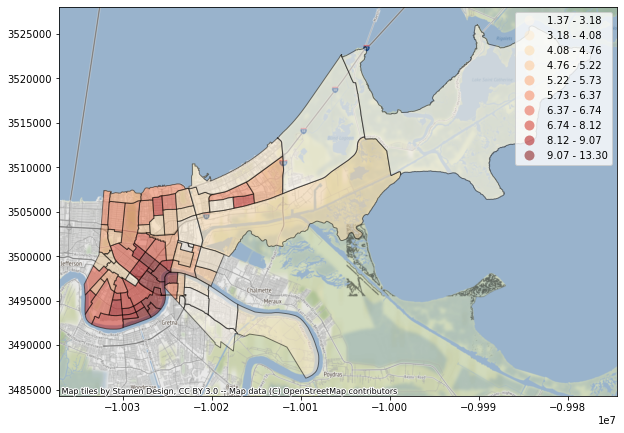

In [116]:
mva_nbh = mva_nbh.to_crs(epsg=3857)
aestheticsplot = mva_nbh.plot(
    figsize=(10, 10), 
    alpha=0.5, 
    edgecolor='k', 
    column='percentnewconstruction', 
    scheme='QUANTILES', 
    k=10, 
    cmap='OrRd', 
    legend=True)
ctx.add_basemap(aestheticsplot)

#### 5.2.3 Affordability Graphs <a name="afgraph"></a>
[Back to Table of Contents](#toc)/[Back to Results](#results)

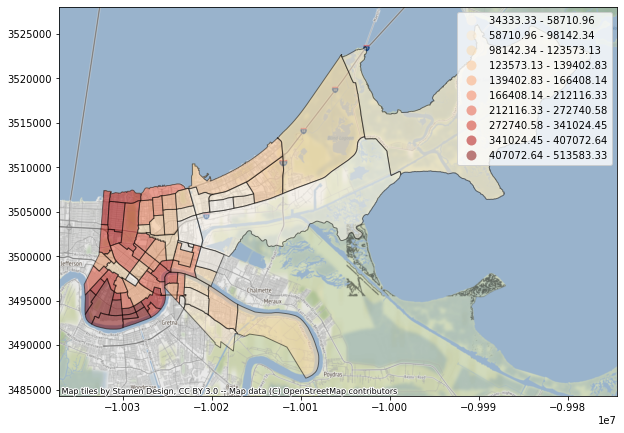

In [117]:
hv_nbh = hv_nbh.to_crs(epsg=3857)
affordplot = hv_nbh.plot(
    figsize=(10, 10), 
    alpha=0.5, 
    edgecolor='k', 
    column='mspxvlnd16', 
    scheme='QUANTILES', 
    k=10, 
    cmap='OrRd', 
    legend=True)
ctx.add_basemap(affordplot)

#### 5.2.4 Safe Environment Graphs <a name="segraph"></a>
[Back to Table of Contents](#toc)/[Back to Results](#results)

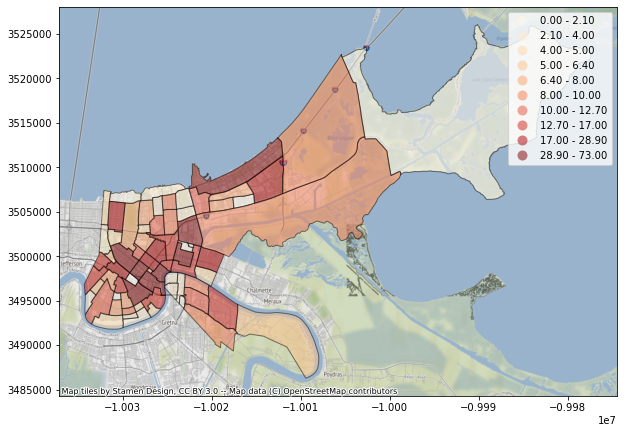

In [134]:
nola_crime = nola_crime.to_crs(epsg=3857)
crimeplot = nola_crime.plot(
    figsize=(10, 10), 
    alpha=0.5, 
    edgecolor='k', 
    column='Crime Total', 
    scheme='QUANTILES', 
    k=10, 
    cmap='OrRd', 
    legend=True)
ctx.add_basemap(crimeplot)

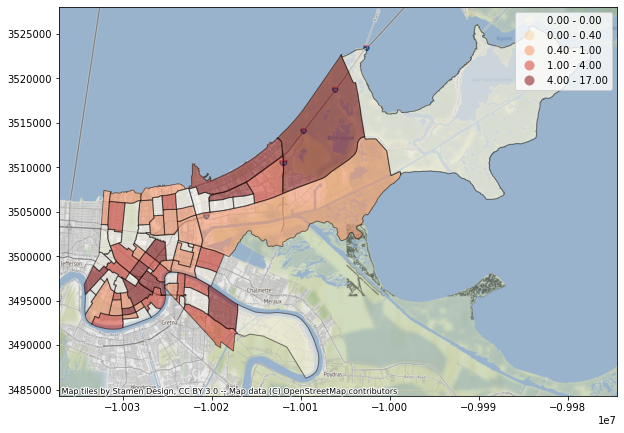

In [119]:
emergency_services_nola = emergency_services_nola.to_crs(epsg=3857)
esplot = emergency_services_nola.plot(
    figsize=(10, 10), 
    alpha=0.5, 
    edgecolor='k', 
    column='ES Total', 
    scheme='QUANTILES', 
    k=5, 
    cmap='OrRd', 
    legend=True)
ctx.add_basemap(esplot)

In [120]:
safe = folium.Map()
safe = create_map(safe)
safe = add_to_map(safe,'Drugstore', drugstore_df_vis,"lightgreen",'plus-square')
safe = add_to_map(safe,'Evacuspot', evacuspots_df_vis,"red",'exclamation-triangle')
safe = add_to_map(safe,'Health Clinic', healthClinic_df_vis,'green','medkit')
safe = add_to_map(safe,'Hospital', hospital_df_vis,'blue','hospital-o')
safe.choropleth(
    geo_data=nola_boundaries,
    fill_color='YlGnBu', 
    fill_opacity=0.2, 
    line_opacity=1.0,
)

folium.LayerControl().add_to(safe)

safe

# crime_df_vis
# drugstore_df_vis 
# evacuspots_df_vis
# healthClinic_df_vis 
# hospital_df_vis

In [121]:
nbh_safe = folium.Map()
nbh_safe = create_map(nbh_safe)

def popup_nbh(neigh, drug, evac, hc, hos, total):
    left_col_colour = "#2A799C"
    right_col_colour = "#C5DCE7"
    
    html = '''<!DOCTYPE html>
    <html>
        <head>
            <style>
                table {
                  font-family: arial, sans-serif;
                  font-size:8pt;
                  border-collapse: collapse;
                  width: 100%;
                }

                td, th {
                  border: 1px solid #dddddd;
                  text-align: left;
                  padding: 8px;
                }

                tr:nth-child(even) {
                  background-color: #dddddd;
                }
            </style>
        </head>
    <body>
    <center><h4>''' + neigh + '''</h4></center>

    <table>
      <tr>
        <th>Total Emergency Services:</th>
        <td>''' + total + '''</td>
      </tr>
      <tr>
        <th>Hospitals:</td>
        <td>''' + hos + '''</td>
      </tr>
      <tr>
        <th>Health Clinics:</th>
        <td>''' + hc + '''</td>
      </tr>
      <tr>
        <th>Drugstores:</td>
        <td>''' + drug + '''</td>
      </tr>
      <tr>
        <th>Evacuspots:</td>
        <td>''' + evac + '''</td>
      </tr>
    </table>

    </body>
    </html>
    '''
    return html

for neigh, drug, evac, hc, hos, total, long, lat in zip(
    emergency_services_nola['Neighborhood'],
    emergency_services_nola['Drugstore'].astype(str),
    emergency_services_nola['Evacuspots'].astype(str),
    emergency_services_nola['Health Clinic'].astype(str),
    emergency_services_nola['Hospital'].astype(str),
    emergency_services_nola['ES Total'].astype(str),
    emergency_services_nola['Longitude'], 
    emergency_services_nola['Latitude']):
    label = popup_nbh(neigh, drug, evac, hc, hos, total)
    iframe = folium.IFrame(html=label, width='auto', height=250)
    popup = folium.Popup(iframe, parse_html=True)
    folium.Marker(
        [lat, long],
        popup=popup,
        icon=folium.Icon(color="blue",icon="info", prefix='fa')
    ).add_to(nbh_safe)

nbh_safe.choropleth(
    geo_data=nola_boundaries,
    fill_color='YlGnBu', 
    fill_opacity=0.2, 
    line_opacity=1.0,
)

folium.LayerControl().add_to(nbh_safe)

nbh_safe

#### 5.2.5 Goods and Services Graphs <a name="gsgraph"></a>
[Back to Table of Contents](#toc)/[Back to Results](#results)

##### 5.2.5.1 Residential <a name="resg"></a>
[Back to Table of Contents](#toc)/[Back to Results](#results)/[5.2.5 Goods and Services Graphs](#gsgraph)
* Our next objective is to add differentiated markers to our map showing areas of residential interest.

Our residential dataframes include:

- [Residential Data](#residentialsets)
    - Schools - schools_df_vis
    - Libraries - library_df_vis
    - Places of Worship - pow_df_vis 

In [122]:
res_graph = folium.Map()
res_graph = create_map(res_graph)
res_graph = add_to_map(res_graph,'School', schools_df_vis,"blue",'graduation-cap')
res_graph = add_to_map(res_graph,'Library', library_df_vis,"darkpurple",'book')
res_graph = add_to_map(res_graph,'Place of Worship', pow_df_vis,'green','institution')

res_graph

In [141]:
nbh_residential = folium.Map()
nbh_residential = create_map(nbh_residential)

def popup_res(neigh, school, library, places, total):
    left_col_colour = "#2A799C"
    right_col_colour = "#C5DCE7"
    
    html = '''<!DOCTYPE html>
    <html>
        <head>
            <style>
                table {
                  font-family: arial, sans-serif;
                  font-size:8pt;
                  border-collapse: collapse;
                  width: 100%;
                }

                td, th {
                  border: 1px solid #dddddd;
                  text-align: left;
                  padding: 8px;
                }

                tr:nth-child(even) {
                  background-color: #dddddd;
                }
            </style>
        </head>
    <body>
    <center><h4>''' + neigh + '''</h4></center>

    <table>
      <tr>
        <th>Total Residential Services:</th>
        <td>''' + total + '''</td>
      </tr>
      <tr>
        <th>Schools:</td>
        <td>''' + school + '''</td>
      </tr>
      <tr>
        <th>Libraries:</th>
        <td>''' + library + '''</td>
      </tr>
      <tr>
        <th>Places of Worship:</td>
        <td>''' + places + '''</td>
      </tr>
    </table>

    </body>
    </html>
    '''
    return html


for neigh, school, library, places, total, long, lat in zip(
    residential_nola['Neighborhood'],
    residential_nola['Schools'].astype(str),
    residential_nola['Library'].astype(str),
    residential_nola['Place of Worship'].astype(str),
    residential_nola['Residential Total'].astype(str),
    residential_nola['Longitude'], 
    residential_nola['Latitude']):
    label = popup_res(neigh, school, library, places, total)
    iframe = folium.IFrame(html=label, width='auto', height=250)
    popup = folium.Popup(iframe, parse_html=True)
    folium.Marker(
        [lat, long],
        popup=popup,
        icon=folium.Icon(color="blue",icon="info", prefix='fa')
    ).add_to(nbh_residential)

nbh_residential.choropleth(
    geo_data=nola_boundaries,
    fill_color='YlGnBu', 
    fill_opacity=0.2, 
    line_opacity=1.0,
)

folium.LayerControl().add_to(nbh_residential)

nbh_residential

In [145]:
residential_nola.head()

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Library,Place of Worship,Schools,Residential Total
12,CENTRAL CITY,"POLYGON ((-90.09828 29.95173, -90.09850 29.951...",POINT (-90.08684 29.94074),-90.086845,29.940735,1.0,57.0,7.0,65.0
56,SEVENTH WARD,"POLYGON ((-90.05698 29.96871, -90.05704 29.969...",POINT (-90.06576 29.97702),-90.065756,29.977018,1.0,23.0,5.0,29.0
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,NaN,14.0,8.0,22.0
60,ST. CLAUDE,"POLYGON ((-90.03137 29.97568, -90.03232 29.975...",POINT (-90.04018 29.97229),-90.040181,29.972291,1.0,17.0,2.0,20.0
46,MID-CITY,"POLYGON ((-90.09041 29.97594, -90.09082 29.976...",POINT (-90.09960 29.97158),-90.099600,29.971582,1.0,9.0,9.0,19.0


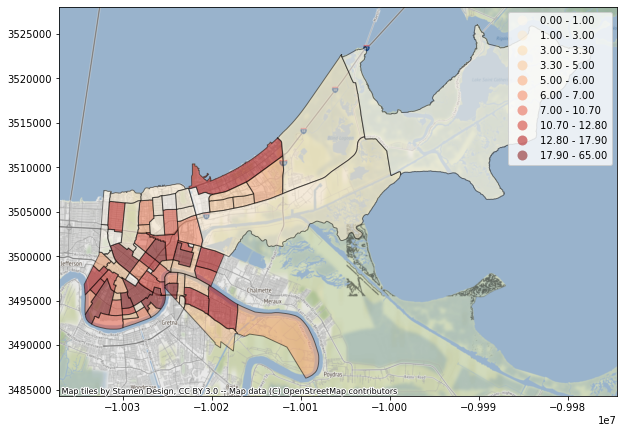

In [146]:
residential_nola = residential_nola.to_crs(epsg=3857)
resplot = residential_nola.plot(
    figsize=(10, 10), 
    alpha=0.5, 
    edgecolor='k', 
    column='Residential Total', 
    scheme='QUANTILES', 
    k=10, 
    cmap='OrRd', 
    legend=True)
ctx.add_basemap(resplot)

##### 5.2.5.2 Hospitality <a name="hosg"></a>
[Back to Table of Contents](#toc)/[Back to Results](#results)/[5.2.5 Goods and Services Graphs](#gsgraph)

- [Hospitality/Tourism:](#hospitalitysets)
    - Hotels/Boarding - hotels_df_vis
    - Visual Arts and Crafts - va_df_vis
    - Restaurants - restaurant_df_vis  
    - Entertainment - entertainment_df_vis

My hospitality sets are too large to map with icons so we'll stick to choropleths.

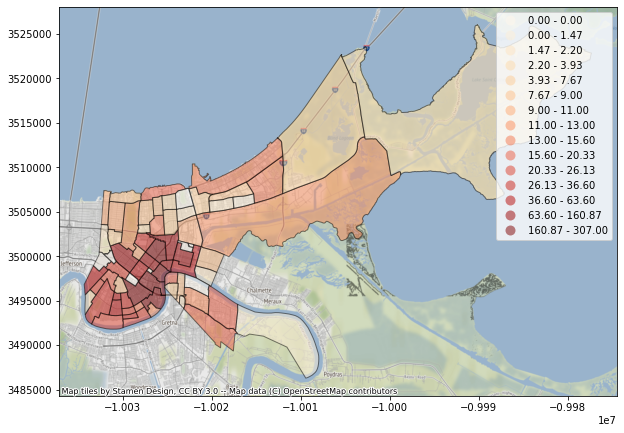

In [147]:
hospitality_nola = hospitality_nola.to_crs(epsg=3857)
hosplot = hospitality_nola.plot(
    figsize=(10, 10), 
    alpha=0.5, 
    edgecolor='k', 
    column='Hospitality Total', 
    scheme='QUANTILES', 
    k=15, 
    cmap='OrRd', 
    legend=True)
ctx.add_basemap(hosplot)

##### 5.2.5.3 Shopping <a name="shopg"></a>
[Back to Table of Contents](#toc)/[Back to Results](#results)/[5.2.5 Goods and Services Graphs](#gsgraph)

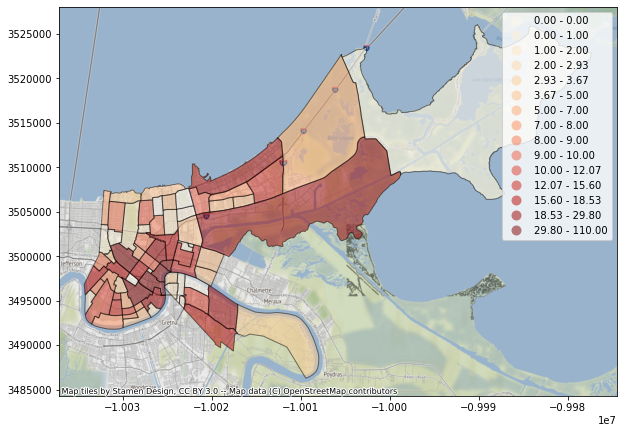

In [148]:
shopping_nola = shopping_nola.to_crs(epsg=3857)
shopplot = shopping_nola.plot(
    figsize=(10, 10), 
    alpha=0.5, 
    edgecolor='k', 
    column='Shopping Total', 
    scheme='QUANTILES', 
    k=15, 
    cmap='OrRd', 
    legend=True)
ctx.add_basemap(shopplot)

##### 5.2.5.4 FourSquare <a name="fourg"></a>
[Back to Table of Contents](#toc)/[Back to Results](#results)/[5.2.5 Goods and Services Graphs](#gsgraph)

In [149]:
nola_graph = nola_merged
nola_graph.head(1)

,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,1.0,Boat or Ferry,Yoga Studio,Furniture / Home Store,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop


In [151]:
#The following code isn't working it returns NotImplementedError: fillna currently only supports filling with a scalar geometry
nola_graph.fillna(0)

NotImplementedError: fillna currently only supports filling with a scalar geometry

Because we cannot fill our NaN values, for this analysis we will be dropping those neighborhoods.

The dropped neighborhoods are: BEHRMAN LAKE CATHERINE READ BLVD WEST
VIAVANT - VENETIAN ISLES VILLAGE DE LEST

In [152]:
nola_graph = nola_graph.dropna(subset=['Cluster Labels'])
nola_graph['CLs'] = nola_graph['Cluster Labels'].astype(int)
nola_graph.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Neighborhood,Boundary_Geometry,Nola_Centroid,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,CLs
0,U.S. NAVAL BASE,"POLYGON ((-90.02668 29.95321, -90.03275 29.955...",POINT (-90.02656 29.94725),-90.026563,29.947251,1.0,Boat or Ferry,Yoga Studio,Furniture / Home Store,French Restaurant,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,Flower Shop,1
1,ALGIERS POINT,"POLYGON ((-90.04538 29.95811, -90.04744 29.958...",POINT (-90.05208 29.95311),-90.052080,29.953112,1.0,Boat or Ferry,Bar,Coffee Shop,Park,Pizza Place,Scenic Lookout,Food & Drink Shop,Music Store,Music Venue,Café,1
2,WHITNEY,"POLYGON ((-90.03808 29.95671, -90.04158 29.957...",POINT (-90.04252 29.94622),-90.042521,29.946223,1.0,Convenience Store,Nightclub,Mobile Phone Shop,Yoga Studio,Farmers Market,Frame Store,Food Truck,Food Court,Food & Drink Shop,Food,1
3,AUDUBON,"POLYGON ((-90.10964 29.94136, -90.11052 29.941...",POINT (-90.12321 29.93145),-90.123206,29.931452,1.0,Park,Light Rail Station,College Arts Building,Coffee Shop,Sculpture Garden,Plaza,Yoga Studio,Farmers Market,Food Court,Food & Drink Shop,1
5,B. W. COOPER,"POLYGON ((-90.08521 29.95046, -90.08527 29.950...",POINT (-90.09161 29.95184),-90.091607,29.951839,1.0,Breakfast Spot,Boxing Gym,Food Truck,Gym / Fitness Center,Fast Food Restaurant,French Restaurant,Frame Store,Food Court,Food & Drink Shop,Food,1


In [153]:
# create map
map_clusters = folium.Map(location=[29.925954, -90.000404], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(nola_graph['Latitude'], nola_graph['Longitude'], nola_graph['Neighborhood'], nola_graph['CLs']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## 6. Conclusion <a name="conclusion"></a>
[Back to Table of Contents](#toc)
- [6.1 Objective Summary](#obsum)
- [6.2 Conclusion Summary](#resum)

### 6.1 Objective Summary <a name="obsum"></a>
Our Objective: To provide New Orleans neighborhood recommendations using public information about demographics, economy, local venues and crime data.

Our Factors of interest are:
- Aesthetics: An attractive neighborhood indicates the residents care about it. - Market Value Data
- Affordability: Sure, you want a cheap house, but you also want to be able to afford the cost of living in the neighborhood.
- Safe environment: Nobody wants a mugger or sex offender as a neighbor.
- Goods and Services: Easy access to goods and services: Can you make a quick run to the bank or grocery store, or will every day be a headache behind the wheel due to traffic congestion or construction? Walking distance to goods and services: Even better, ditch the car. If exercise and a sense of community are important to you, find a house near the establishments you'll be frequenting.

### 6.2 Conclusion Summary <a name="resum"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

- [6.2.1 Aesthetics](#sumaes)
- [6.2.2 Affordability](#sumaf)
- [6.2.3 Safe environment](#sumse)
    - [6.2.3.1 Emergency Services](#sumes)
    - [6.2.3.2 Lowest Crime](#sumcd)
- [6.2.4 Goods and Services ](#sumgs)
    - [6.2.4.1 Residential Goods and Services](#sumres)
    - [6.2.4.2 Hospitality/Tourism Goods and Services](#sumhos)
    - [6.2.4.3 Shopping Goods and Services](#sumsho)
- [6.2.5 FourSquare Clustering Results](#sumfour)

#### 6.2.1 Aesthetics Top 5 Neighborhoods: <a name="sumaes"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [ ]:
def top_5(ndfname,df,column):
    ndfname = df.reset_index
    

aes_top = mvh_nbh.reset_index
aes_top = aes_top[['Neighborhood','percentnewconstruction']]
aes_top = aes_top.sort_values(by=['percentnewconstruction'], ascending=False)
aes_top.head()

In [283]:
aes_top = mvh_nbh.reset_index
aes_top = aes_top[['Neighborhood','percentnewconstruction']]
aes_top = aes_top.sort_values(by=['percentnewconstruction'], ascending=False)
aes_top.head()

,Neighborhood,percentnewconstruction
0,IBERVILLE,13.297393
1,FRENCH QUARTER,12.635191
2,CENTRAL BUSINESS DISTRICT,11.145962
3,LOWER GARDEN DISTRICT,10.665407
4,ALGIERS POINT,10.305526


#### 6.2.2 Affordability Top 5 Neighborhoods: <a name="sumaf"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [287]:
aff_top = hv_nbh.reset_index()
aff_top = aff_top[['Neighborhood','mspxvlnd16']]
aff_top = aff_top.sort_values(by=['mspxvlnd16'], ascending=False)
aff_top.head()

,Neighborhood,mspxvlnd16
0,BLACK PEARL,513583.333333
1,AUDUBON,503469.027778
2,WEST RIVERSIDE,496099.285714
3,UPTOWN,486737.250000
4,TOURO,435895.454545


#### 6.2.3 Safe Environment: <a name="sumse"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [289]:
def top_5(_top, df, total, tf):
    _top = df[['Neighborhood', total]]
    _top = _top.sort_values(by=[total], ascending=tf)
    return _top

##### 6.2.3.1 Emergency Services Top 5 Neighborhoods: <a name="sumes"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [292]:
es_top = pd.DataFrame()
es_top = top_5(es_top, emergency_services_nola, 'ES Total', False)
es_top.head()

,Neighborhood,ES Total
11,CENTRAL BUSINESS DISTRICT,17.0
12,CENTRAL CITY,9.0
65,TULANE - GRAVIER,8.0
64,TOURO,8.0
40,LEONIDAS,7.0


##### 6.2.3.2 Lowest Crime 5 Neighborhoods: <a name="sumcd"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [299]:
crime_top = pd.DataFrame()
crime_top = top_5(crime_top, nola_crime, 'Crime Total', True)
crime_top.head(5)

,Neighborhood,Crime Total
24,FLORIDA DEV,0.0
1,ALGIERS POINT,0.0
8,BLACK PEARL,0.0
2,WHITNEY,1.0
62,ST. THOMAS DEV,1.0


#### 6.2.4 Goods and Services: <a name="sumgs"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

##### 6.2.4.1 Residential Top 5 Neighborhoods: <a name="sumres"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [294]:
res_top = pd.DataFrame()
res_top = top_5(res_top, residential_nola, 'Residential Total', False)
res_top.head()

,Neighborhood,Residential Total
12,CENTRAL CITY,65.0
56,SEVENTH WARD,29.0
3,AUDUBON,22.0
60,ST. CLAUDE,20.0
47,MILAN,19.0


##### 6.2.4.2 Hospitality/Tourism Top 5 Neighborhoods: <a name="sumhos"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [295]:
hos_top = pd.DataFrame()
hos_top = top_5(hos_top, hospitality_nola, 'Hospitality Total', False)
hos_top.head()

,Neighborhood,Hospitality Total
11,CENTRAL BUSINESS DISTRICT,326
68,FRENCH QUARTER,239
12,CENTRAL CITY,200
41,LOWER GARDEN DISTRICT,175
56,SEVENTH WARD,163


##### 6.2.4.3 Shopping Top 5 Neighborhoods: <a name="sumaes"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

In [296]:
shop_top = pd.DataFrame()
shop_top = top_5(shop_top, shopping_nola, 'Shopping Total', False)
shop_top.head()

,Neighborhood,Shopping Total
68,FRENCH QUARTER,110.0
11,CENTRAL BUSINESS DISTRICT,102.0
46,MID-CITY,65.0
12,CENTRAL CITY,63.0
43,MARIGNY,32.0


##### 6.2.5 FourSquare Cluster Results <a name="sumaes"></a>
[Back to Table of Contents](#toc)/[Back to Conclusion Summary](#toc)

- Purple = Residential/Hospitality/Business
- Turquoise = Parks/Marina
- Blue = Playgrounds
- Red = Food
- Orange = Undetermined

In [154]:
map_clusters